## Risk analysis of loan applicant - case study.

The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history.

When the company receives a loan application, the company has to decide for loan approval based on the applicant’s profile. 

Two types of risks are associated with the bank’s decision:

1. If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

2. If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.

#### Problem Statement:

This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.

#### Importing the libraries.

In [287]:
#import the warnings.
import warnings
warnings.filterwarnings('ignore')

In [288]:
#import the useful libraries.
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### Understanding the data.

1. 'application_data.csv'  contains all the information of the client at the time of application.
The data is about whether a client has payment difficulties.

2. 'previous_application.csv' contains information about the client’s previous loan data. It contains the data on whether the previous application had been Approved, Cancelled, Refused or Unused offer.

3. 'columns_description.csv' is data dictionary which describes the meaning of the variables.

#### Reading the Previous application data set. 

In [289]:
#reading the data set of "previous application data" in df_pre.
df_pre = pd.read_csv('previous_application.csv')
df_pre.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [290]:
df_pre.shape

(1670214, 37)

In [291]:
df_pre.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [292]:
df_pre.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [293]:
df_pre_percent = df_pre.isnull().sum() / len(df_pre) * 100
df_pre_percent

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [294]:
df_pre_percent_40 = df_pre_percent[df_pre_percent > 40]
df_pre_percent_40

AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
NAME_TYPE_SUITE              49.119754
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
dtype: float64

### Dropping columns with more than 40% null values present in it.

In [295]:
df_pre_percent_40.index

Index(['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'DAYS_FIRST_DRAWING',
       'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
       'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [296]:
df_pre.drop(['AMT_DOWN_PAYMENT','RATE_DOWN_PAYMENT','RATE_INTEREST_PRIMARY','RATE_INTEREST_PRIVILEGED',
             'NAME_TYPE_SUITE','DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION',
             'DAYS_LAST_DUE','DAYS_TERMINATION','NFLAG_INSURED_ON_APPROVAL'],axis=1,inplace=True)

In [297]:
df_pre.shape

(1670214, 26)

### Converting negative values of columns to absolute values.

In [298]:
df_pre['DAYS_DECISION'] = abs(df_pre['DAYS_DECISION'])

### Plotting null values.

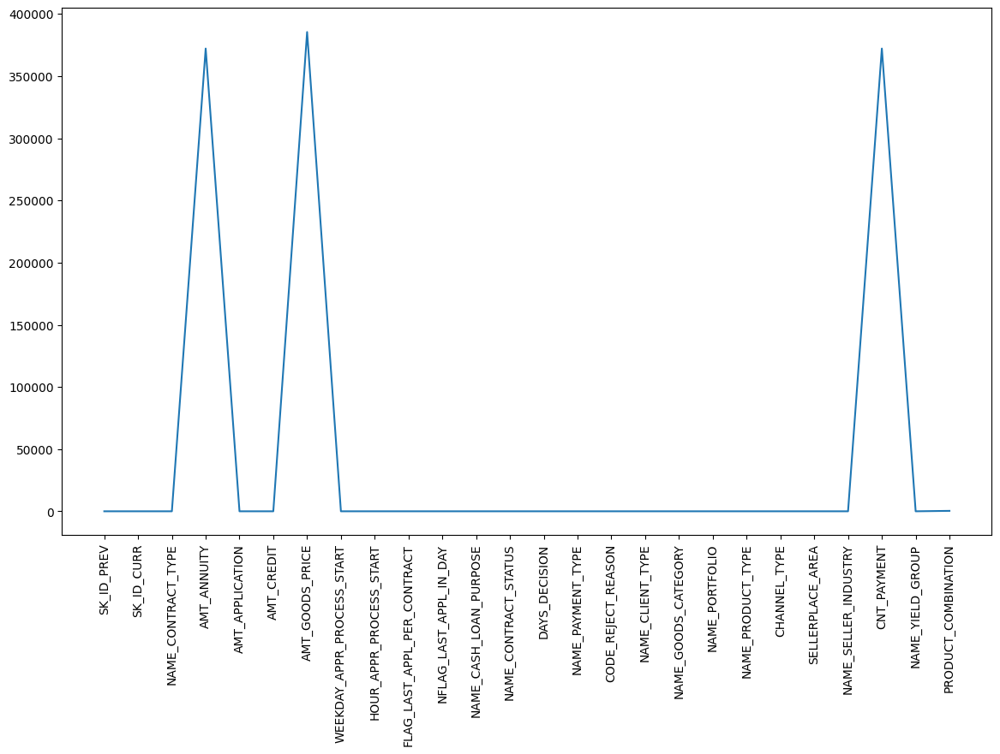

In [299]:
plt.figure(figsize=(14,8))
sns.lineplot(data=df_pre.isnull().sum())
plt.xticks(rotation= 90)
plt.show()

#### Now we have to look into these columns one by one which have null values present in it.

#### Columns-

1. AMT_ANNUITY
2. AMT_GOODS_PRICE
3. CNT_PAYMENT

#### 1. df_pre['AMT_ANNUITY'] = Annuity of previous application

In [300]:
df_pre['AMT_ANNUITY'].describe()

count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

<AxesSubplot:xlabel='AMT_ANNUITY', ylabel='Density'>

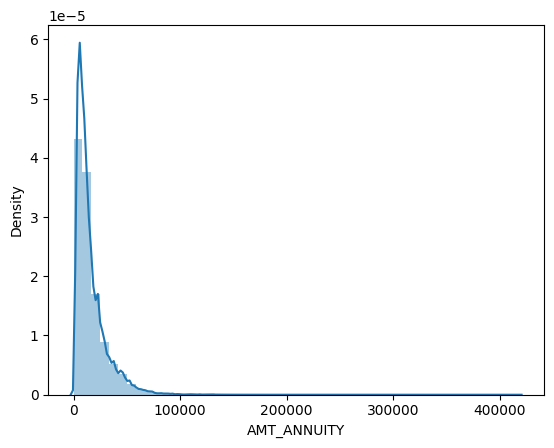

In [301]:
sns.distplot(df_pre['AMT_ANNUITY'])

<AxesSubplot:xlabel='AMT_ANNUITY'>

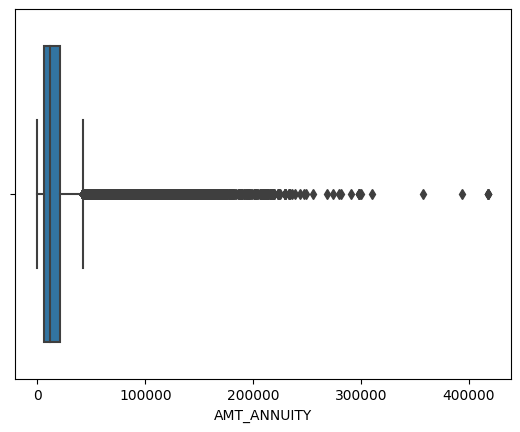

In [302]:
sns.boxplot(df_pre['AMT_ANNUITY'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [303]:
df_pre['AMT_ANNUITY'].isnull().sum()

372235

In [304]:
# filling the missing values with median value.
df_pre['AMT_ANNUITY'].fillna(df_pre['AMT_ANNUITY'].median(), inplace=True)

In [305]:
df_pre['AMT_ANNUITY'].isnull().sum()

0

In [306]:
df_pre['AMT_ANNUITY'].shape

(1670214,)

Outlier treatment (Values > 350000)

In [307]:
df_pre = df_pre[df_pre['AMT_ANNUITY'] <= 350000]

In [308]:
df_pre['AMT_ANNUITY'].shape

(1670208,)

---->>> After removing outliers we have 1670208 rows from 1670214.

#### 2. df_pre['AMT_GOODS_PRICE] = Goods price of good that client asked for (if applicable) on the previous application

In [309]:
df_pre['AMT_GOODS_PRICE'].describe()

count    1.284693e+06
mean     2.278372e+05
std      3.153623e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64

<AxesSubplot:xlabel='AMT_GOODS_PRICE', ylabel='Density'>

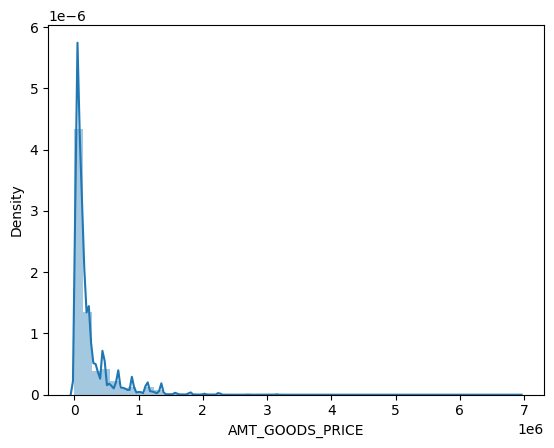

In [310]:
sns.distplot(df_pre['AMT_GOODS_PRICE'])

<AxesSubplot:xlabel='AMT_GOODS_PRICE'>

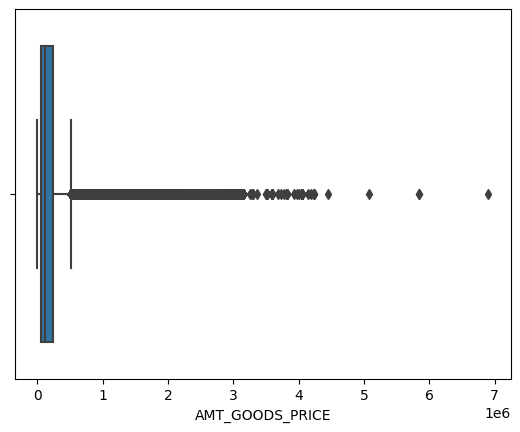

In [311]:
sns.boxplot(x= df_pre['AMT_GOODS_PRICE'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [312]:
df_pre['AMT_GOODS_PRICE'].isnull().sum()

385515

In [313]:
# filling the missing values with median value.
df_pre['AMT_GOODS_PRICE'].fillna(df_pre['AMT_GOODS_PRICE'].median(), inplace=True)

In [314]:
df_pre['AMT_GOODS_PRICE'].isnull().sum()

0

In [315]:
df_pre['AMT_GOODS_PRICE'].shape

(1670208,)

Removing outliers (values > 5000000)

In [316]:
df_pre = df_pre[df_pre['AMT_GOODS_PRICE'] <= 5000000]

In [317]:
df_pre['AMT_GOODS_PRICE'].shape

(1670204,)

---->>> After removing outliers we have 1670204 rows from 1670208.

#### 3. df_pre['CNT_PAYMENT'] = Term of previous credit at application of the previous application

In [318]:
df_pre['CNT_PAYMENT'].describe()

count    1.297975e+06
mean     1.605402e+01
std      1.456714e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.400000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64

<AxesSubplot:xlabel='CNT_PAYMENT'>

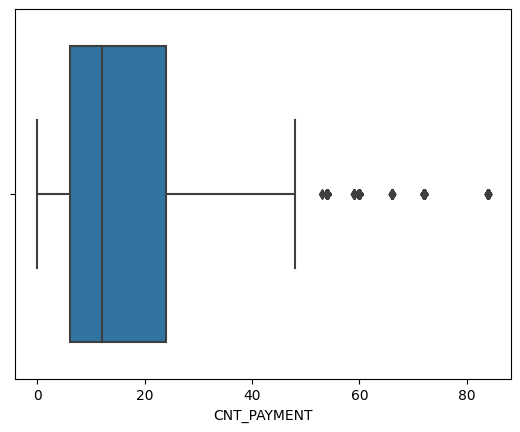

In [319]:
sns.boxplot(x= df_pre['CNT_PAYMENT'])

<AxesSubplot:xlabel='CNT_PAYMENT', ylabel='Density'>

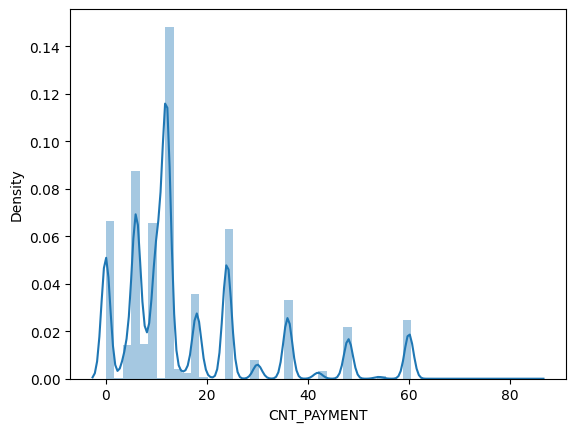

In [320]:
sns.distplot(df_pre['CNT_PAYMENT'])

---->>> There is not much difference between mean & median. It means we have balanced distribution. So we are filling null values with mean for this column.

In [321]:
df_pre['CNT_PAYMENT'].isnull().sum()

372229

In [322]:
# filling the missing values with mean value.
df_pre['CNT_PAYMENT'].fillna(df_pre['CNT_PAYMENT'].mean(), inplace=True)

In [323]:
df_pre['CNT_PAYMENT'].isnull().sum()

0

In [324]:
df_pre['CNT_PAYMENT'].shape

(1670204,)

Outlier treatment(Value > 80)

In [325]:
df_pre = df_pre[df_pre['CNT_PAYMENT'] <= 80]

In [326]:
df_pre['CNT_PAYMENT'].shape

(1670159,)

---->>> After removing outliers we have 1670159 rows from 1670204.

### Checking the null value count in remaining columns.

In [327]:
df_pre.isnull().sum()

SK_ID_PREV                       0
SK_ID_CURR                       0
NAME_CONTRACT_TYPE               0
AMT_ANNUITY                      0
AMT_APPLICATION                  0
AMT_CREDIT                       1
AMT_GOODS_PRICE                  0
WEEKDAY_APPR_PROCESS_START       0
HOUR_APPR_PROCESS_START          0
FLAG_LAST_APPL_PER_CONTRACT      0
NFLAG_LAST_APPL_IN_DAY           0
NAME_CASH_LOAN_PURPOSE           0
NAME_CONTRACT_STATUS             0
DAYS_DECISION                    0
NAME_PAYMENT_TYPE                0
CODE_REJECT_REASON               0
NAME_CLIENT_TYPE                 0
NAME_GOODS_CATEGORY              0
NAME_PORTFOLIO                   0
NAME_PRODUCT_TYPE                0
CHANNEL_TYPE                     0
SELLERPLACE_AREA                 0
NAME_SELLER_INDUSTRY             0
CNT_PAYMENT                      0
NAME_YIELD_GROUP                 0
PRODUCT_COMBINATION            346
dtype: int64

## We still have 2 columns with null values present in it. 

#### 1. df_pre['AMT_CREDIT'] = Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT

In [328]:
df_pre['AMT_CREDIT'].isnull().sum()

1

In [329]:
df_pre['AMT_CREDIT'].describe()

count    1.670158e+06
mean     1.960670e+05
std      3.184150e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.053650e+04
75%      2.164185e+05
max      4.104351e+06
Name: AMT_CREDIT, dtype: float64

<AxesSubplot:xlabel='AMT_CREDIT'>

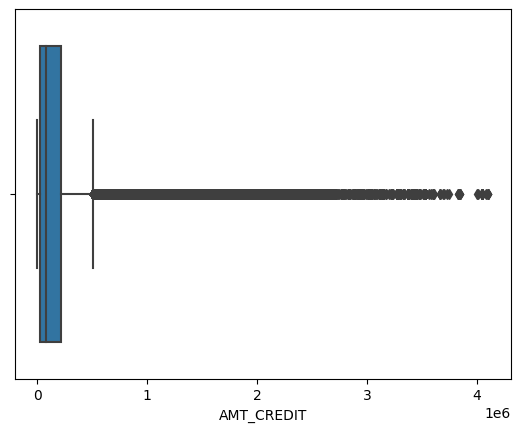

In [330]:
sns.boxplot(df_pre['AMT_CREDIT'])

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='Density'>

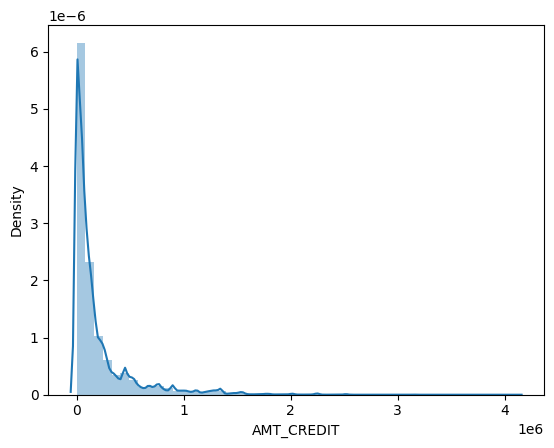

In [331]:
sns.distplot(df_pre['AMT_CREDIT'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [332]:
# filling the missing values with median value.
df_pre['AMT_CREDIT'].fillna(df_pre['AMT_CREDIT'].median(), inplace=True)

In [333]:
df_pre['AMT_CREDIT'].isnull().sum()

0

#### 2. df_pre['PRODUCT_COMBINATION'] = Detailed product combination of the previous application

In [334]:
df_pre['PRODUCT_COMBINATION'].isnull().sum()

346

In [335]:
df_pre['PRODUCT_COMBINATION'].describe()

count     1669813
unique         17
top          Cash
freq       285990
Name: PRODUCT_COMBINATION, dtype: object

#### This is a categorical column

In [336]:
df_pre['PRODUCT_COMBINATION'].value_counts()

Cash                              285990
POS household with interest       263621
POS mobile with interest          220670
Cash X-Sell: middle               143878
Cash X-Sell: low                  130224
Card Street                       112582
POS industry with interest         98828
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34654
Cash Street: low                   33818
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

---->>> We are filling null values with 'Cash'(i.e. mode) for this column.

In [337]:
df_pre['PRODUCT_COMBINATION'].mode()[0]

'Cash'

In [338]:
# filling the missing values with mode value.
df_pre['PRODUCT_COMBINATION'].fillna(df_pre['PRODUCT_COMBINATION'].mode()[0], inplace=True)

In [339]:
df_pre['PRODUCT_COMBINATION'].isnull().sum()

0

## Univariate analysis of 'previous_application.csv'

### Categorical columns - 

In [340]:
df_pre.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [341]:
categorical_col_pre = ['NAME_CONTRACT_TYPE','WEEKDAY_APPR_PROCESS_START','FLAG_LAST_APPL_PER_CONTRACT',
                   'NAME_CASH_LOAN_PURPOSE','NAME_CONTRACT_STATUS','NAME_PAYMENT_TYPE','CODE_REJECT_REASON',
                   'NAME_CLIENT_TYPE','NAME_GOODS_CATEGORY','NAME_PORTFOLIO','NAME_PRODUCT_TYPE','CHANNEL_TYPE',
                   'NAME_SELLER_INDUSTRY','NAME_YIELD_GROUP','PRODUCT_COMBINATION']

In [342]:
for i in categorical_col_pre:
    print(f'-----------{i}------------')
    print(df_pre[i].value_counts())
    print('-----------------------------------')

-----------NAME_CONTRACT_TYPE------------
Cash loans         747504
Consumer loans     729145
Revolving loans    193164
XNA                   346
Name: NAME_CONTRACT_TYPE, dtype: int64
-----------------------------------
-----------WEEKDAY_APPR_PROCESS_START------------
TUESDAY      255115
WEDNESDAY    254998
MONDAY       253550
FRIDAY       252032
THURSDAY     249085
SATURDAY     240631
SUNDAY       164748
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
-----------------------------------
-----------FLAG_LAST_APPL_PER_CONTRACT------------
Y    1661684
N       8475
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64
-----------------------------------
-----------NAME_CASH_LOAN_PURPOSE------------
XAP                                 922655
XNA                                 677873
Repairs                              23762
Other                                15607
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          269

Approved        1036774
Canceled         316312
Refused          290637
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64
-----------------------------------
-----------NAME_PAYMENT_TYPE------------
Cash through the bank                        1033499
XNA                                           627383
Non-cash from your account                      8193
Cashless from the account of the employer       1084
Name: NAME_PAYMENT_TYPE, dtype: int64
-----------------------------------
-----------CODE_REJECT_REASON------------
XAP       1353079
HC         175209
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5239
VERIF        3521
SYSTEM        717
Name: CODE_REJECT_REASON, dtype: int64
-----------------------------------
-----------NAME_CLIENT_TYPE------------
Repeater     1231212
New           301358
Refreshed     135648
XNA             1941
Name: NAME_CLIENT_TYPE, dtype: int64
-----------------------------------
-----------NAME_GOODS_CA

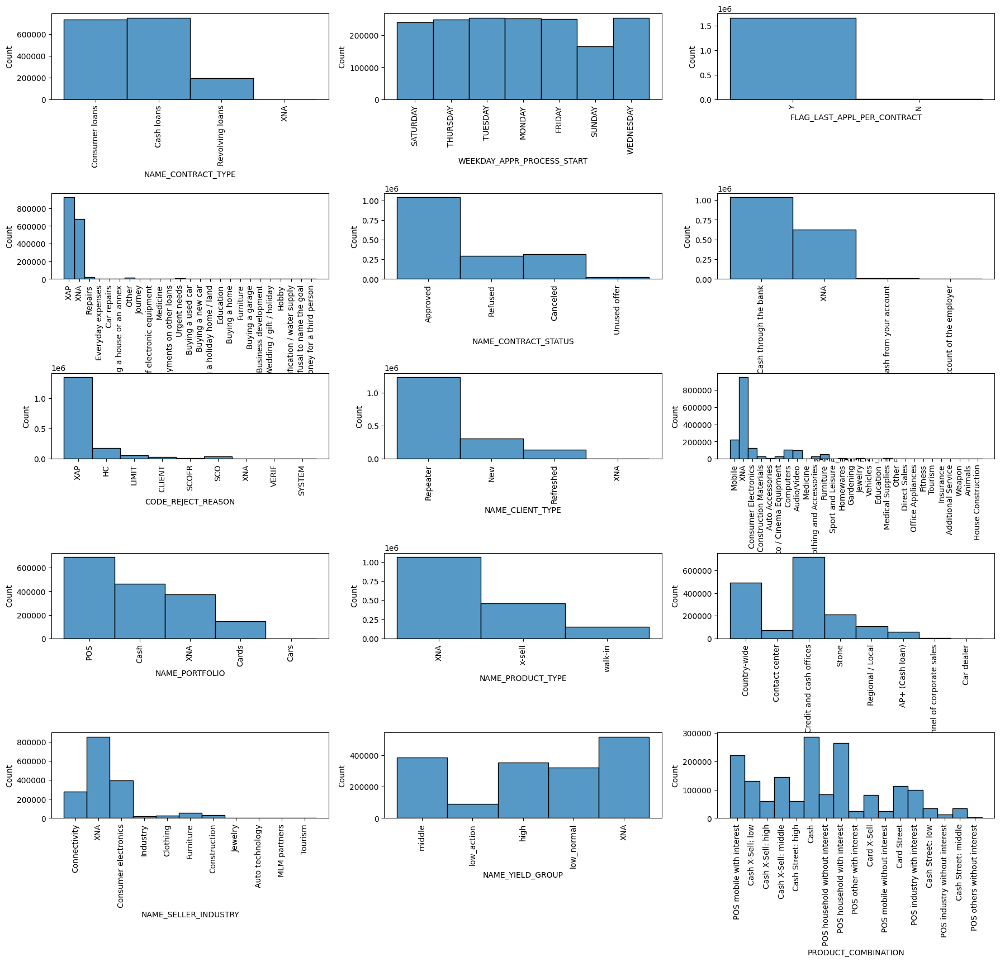

In [343]:
plt.figure(figsize=(25,18))
for i,j in zip(categorical_col_pre,range(len(categorical_col_pre))): 
    plt.subplot(5,3,j+1) 
    sns.histplot(df_pre[i])
    plt.xticks(rotation=90)
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=1.1)
plt.show()

### Observations ---->>>

1. Cash loans are the highest(747504) with little margin from consumer loans(729145).
2. The client applied for previous application on every day of the week with approximately same frequency except Sunday.
3. In 1661684 cases it was last application for the previous contract.
4. 'XAP' is the highest category of cash loan purpose followed by 'XNA' & 'Repairs'.
5. Previous contract was approved for 1036774 applicants and canceled for 316312 applicants. In 290637 cases it was     refused.
6. The client chose 'cash through bank' option in most cases(1033499) and went for cashless in least cases(1084).  
7. When applying for previous application the client was repeater in 1231212 cases and new in 301358 cases.
8. The client applied for 'XNA' goods in 950757 cases followed by Mobile goods in 224708 cases in the previous application. Animal and House Construction are the least number of goods here.
9. Previous application was for 'POS' in 691009 cases,'Cash' in 461514 cases and 'Cars' in only 422 cases. 
10. Previous application was 'x-sell' in 456242 cases which is three times as in 'walk-in' cases.
11. We acquired the client on the previous application through 'Credit and cash offices' in highest 719919 cases and least through 'Car dealer' in 449 cases.
12. The industry of seller is 'Consumer electronics' in 398264 cases and 'Tourism' in least 513 cases.
13. Grouped interest rate was in middle category in 385523 cases, high in 353331, low normal in 322066 and low action in least 92025 cases.
14. Product combination in Cash category is highest in 286336 cases followed by POS household with interest category in 263621 cases. It is least in POS others without interest category in 2555 cases.

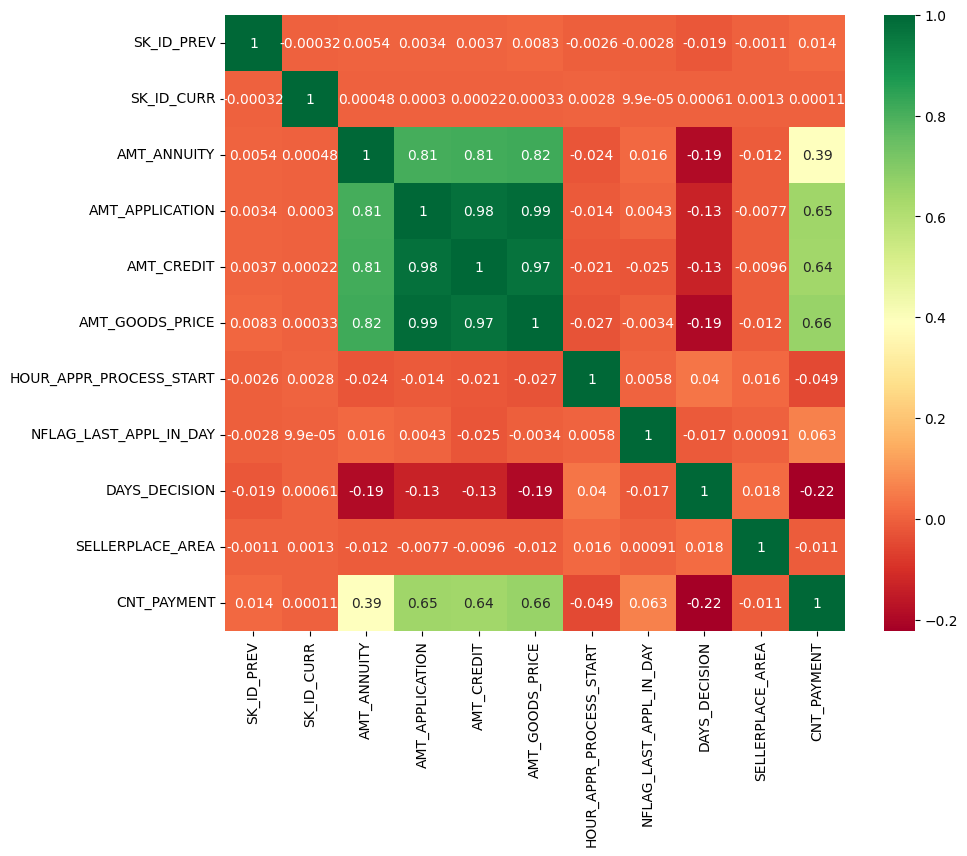

In [344]:
plt.figure(figsize=(10,8))
sns.heatmap(data= df_pre.corr(), cmap='RdYlGn', annot=True)
plt.show()

---->>> Following columns have strong postive correlation among themselves.

1. AMT_ANNUITY
2. AMT_APPLICATION
3. AMT_CREDIT
4. AMT_GOODS_PRICE

#### Reading the Application data set.

In [345]:
#reading the data set of "application data" in df_app.
df_app = pd.read_csv('application_data.csv')
df_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [346]:
df_app.shape

(307511, 122)

In [347]:
df_app.isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

In [348]:
df_app_percent = df_app.isnull().sum() / len(df_app) * 100
df_app_percent

SK_ID_CURR                     0.000000
TARGET                         0.000000
NAME_CONTRACT_TYPE             0.000000
CODE_GENDER                    0.000000
FLAG_OWN_CAR                   0.000000
                                ...    
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
Length: 122, dtype: float64

In [349]:
df_app_percent_40 = df_app_percent[df_app_percent > 40]
df_app_percent_40

OWN_CAR_AGE                     65.990810
EXT_SOURCE_1                    56.381073
APARTMENTS_AVG                  50.749729
BASEMENTAREA_AVG                58.515956
YEARS_BEGINEXPLUATATION_AVG     48.781019
YEARS_BUILD_AVG                 66.497784
COMMONAREA_AVG                  69.872297
ELEVATORS_AVG                   53.295980
ENTRANCES_AVG                   50.348768
FLOORSMAX_AVG                   49.760822
FLOORSMIN_AVG                   67.848630
LANDAREA_AVG                    59.376738
LIVINGAPARTMENTS_AVG            68.354953
LIVINGAREA_AVG                  50.193326
NONLIVINGAPARTMENTS_AVG         69.432963
NONLIVINGAREA_AVG               55.179164
APARTMENTS_MODE                 50.749729
BASEMENTAREA_MODE               58.515956
YEARS_BEGINEXPLUATATION_MODE    48.781019
YEARS_BUILD_MODE                66.497784
COMMONAREA_MODE                 69.872297
ELEVATORS_MODE                  53.295980
ENTRANCES_MODE                  50.348768
FLOORSMAX_MODE                  49

### Dropping columns with more than 40% null values present in it.

In [350]:
df_app_percent_40.index

Index(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FO

In [351]:
df_app.drop(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE',
       'TOTALAREA_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],axis=1,inplace=True)

In [352]:
df_app.shape

(307511, 73)

### Converting negative values of columns to absolute values.

In [353]:
df_app['DAYS_BIRTH'] = abs(df_app['DAYS_BIRTH'])
df_app['DAYS_EMPLOYED'] = abs(df_app['DAYS_EMPLOYED'])
df_app['DAYS_REGISTRATION'] = abs(df_app['DAYS_REGISTRATION'])
df_app['DAYS_ID_PUBLISH'] = abs(df_app['DAYS_ID_PUBLISH'])
df_app['DAYS_LAST_PHONE_CHANGE'] = abs(df_app['DAYS_LAST_PHONE_CHANGE'])

### Plotting null values.

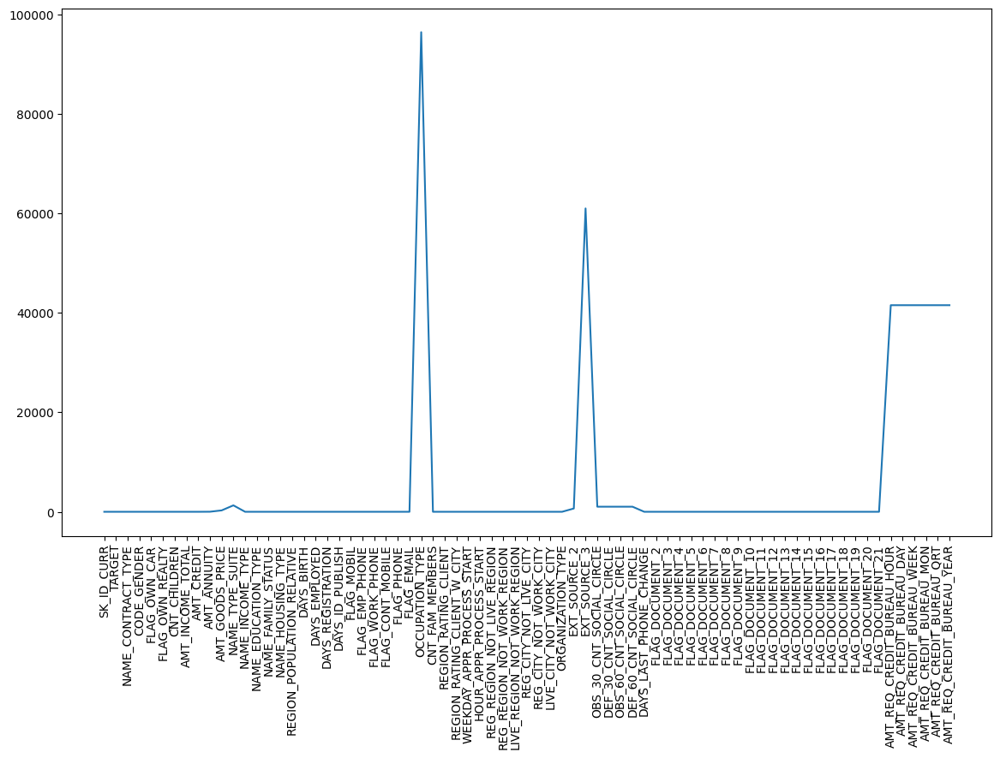

In [354]:
plt.figure(figsize=(14,8))
sns.lineplot(data=df_app.isnull().sum())
plt.xticks(rotation= 90)
plt.show()

### Dropping some redundant columns.

In [355]:
# We don't know about these external sources and what type of scores it has. 
df_app.drop(['EXT_SOURCE_2','EXT_SOURCE_3',],axis=1,inplace=True)

### Checking the null value count in remaining columns.

In [356]:
df_app.isnull().sum()[df_app.isnull().sum() > 0]

AMT_ANNUITY                      12
AMT_GOODS_PRICE                 278
NAME_TYPE_SUITE                1292
OCCUPATION_TYPE               96391
CNT_FAM_MEMBERS                   2
OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
OBS_60_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
dtype: int64

#### Now we have to look into these columns one by one which have null values present in it.

#### Columns-

1. AMT_ANNUITY 
2. AMT_GOODS_PRICE
3. NAME_TYPE_SUITE
4. OCCUPATION_TYPE
5. CNT_FAM_MEMBERS 
6. OBS_30_CNT_SOCIAL_CIRCLE 
7. DEF_30_CNT_SOCIAL_CIRCLE
8. OBS_60_CNT_SOCIAL_CIRCLE
9. DEF_60_CNT_SOCIAL_CIRCLE
10. DAYS_LAST_PHONE_CHANGE
11. AMT_REQ_CREDIT_BUREAU_HOUR
12. AMT_REQ_CREDIT_BUREAU_DAY
13. AMT_REQ_CREDIT_BUREAU_WEEK
14. AMT_REQ_CREDIT_BUREAU_MON
15. AMT_REQ_CREDIT_BUREAU_QRT
16. AMT_REQ_CREDIT_BUREAU_YEAR

#### 1. df_app['AMT_ANNUITY'] = Loan annuity 

In [357]:
df_app['AMT_ANNUITY'].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

<AxesSubplot:xlabel='AMT_ANNUITY', ylabel='Density'>

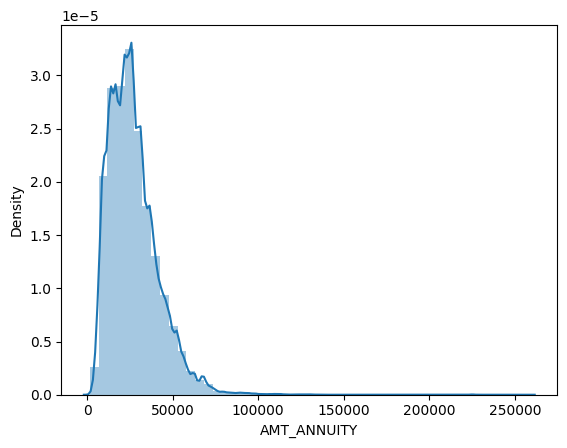

In [358]:
sns.distplot(df_app['AMT_ANNUITY'])

<AxesSubplot:xlabel='AMT_ANNUITY'>

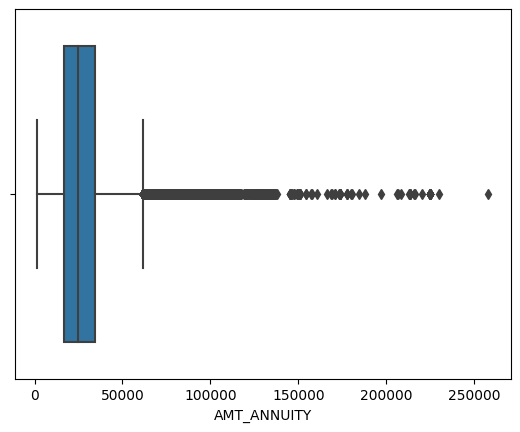

In [359]:
sns.boxplot(x= df_app['AMT_ANNUITY'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [360]:
df_app['AMT_ANNUITY'].isnull().sum()

12

In [361]:
# filling the missing values with median value.
df_app['AMT_ANNUITY'].fillna(df_app['AMT_ANNUITY'].median(), inplace=True)

In [362]:
df_app['AMT_ANNUITY'].isnull().sum()

0

In [363]:
df_app['AMT_ANNUITY'].shape

(307511,)

Outlier treatment(value > 250000)

In [364]:
df_app = df_app[df_app['AMT_ANNUITY'] <= 250000]

In [365]:
df_app['AMT_ANNUITY'].shape

(307510,)

---->>> we have removed one outlier which has value more than 250000.

#### 2. df_app['AMT_GOODS_PRICE'] = For consumer loans it is the price of the goods for which the loan is given

In [366]:
df_app['AMT_GOODS_PRICE'].describe()

count    3.072320e+05
mean     5.383848e+05
std      3.693927e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

<AxesSubplot:xlabel='AMT_GOODS_PRICE', ylabel='Density'>

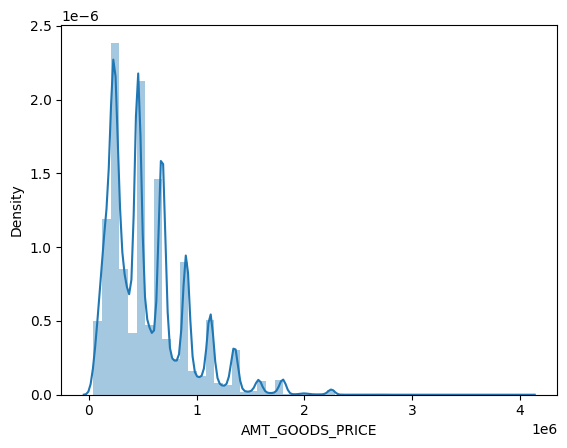

In [367]:
sns.distplot(df_app['AMT_GOODS_PRICE'])

<AxesSubplot:xlabel='AMT_GOODS_PRICE'>

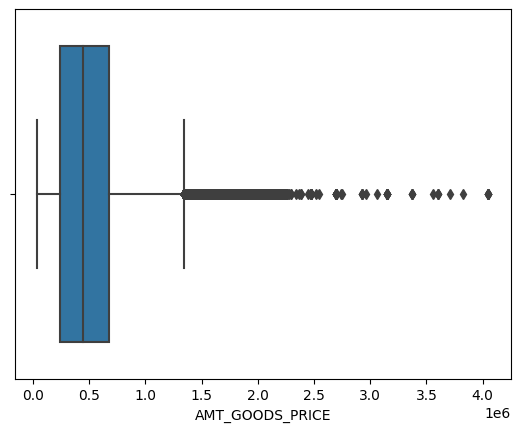

In [368]:
sns.boxplot(x=df_app['AMT_GOODS_PRICE'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [369]:
df_app['AMT_GOODS_PRICE'].isnull().sum()

278

In [370]:
# filling the missing values with median value.
df_app['AMT_GOODS_PRICE'].fillna(df_app['AMT_GOODS_PRICE'].median(), inplace=True)

In [371]:
df_app['AMT_GOODS_PRICE'].isnull().sum()

0

#### 3. df_app['NAME_TYPE_SUITE'] = Who was accompanying client when he was applying for the loan

In [372]:
df_app['NAME_TYPE_SUITE'].describe()

count            306218
unique                7
top       Unaccompanied
freq             248525
Name: NAME_TYPE_SUITE, dtype: object

It is a categorical column

In [373]:
df_app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248525
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

---->>> We are filling null values with 'Unaccompanied'(i.e. mode) for this column.

In [374]:
df_app['NAME_TYPE_SUITE'].isnull().sum()

1292

In [375]:
# filling the missing values with mode value.
df_app['NAME_TYPE_SUITE'].fillna(df_app['NAME_TYPE_SUITE'].mode()[0], inplace=True)

In [376]:
df_app['NAME_TYPE_SUITE'].isnull().sum()

0

#### 4. df_app['OCCUPATION_TYPE'] = What kind of occupation does the client have

In [377]:
df_app['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21370
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

---->>> We are creating 'Missing Data' category here and we are filling null values with this category for this column.

In [378]:
df_app['OCCUPATION_TYPE'].isnull().sum()

96391

In [379]:
# filling the missing values with 'Missing Data' value.
df_app['OCCUPATION_TYPE'].fillna('Missing Data', inplace=True)

In [380]:
df_app['OCCUPATION_TYPE'].value_counts()

Missing Data             96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21370
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

#### 5. df_app['CNT_FAM_MEMBERS'] = How many family members does client have.

In [381]:
df_app['CNT_FAM_MEMBERS'].describe()

count    307508.000000
mean          2.152659
std           0.910677
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64

<AxesSubplot:xlabel='CNT_FAM_MEMBERS', ylabel='Density'>

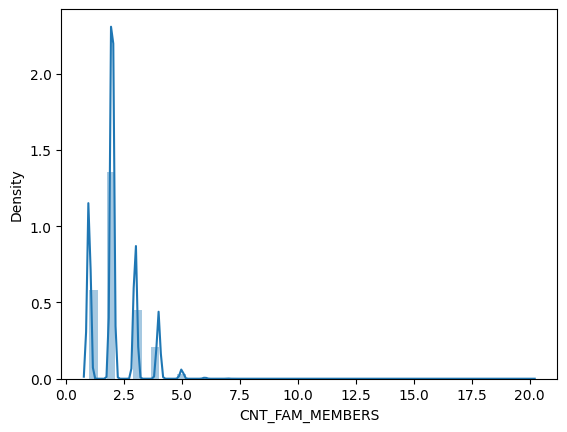

In [382]:
sns.distplot(df_app['CNT_FAM_MEMBERS'])

<AxesSubplot:xlabel='CNT_FAM_MEMBERS'>

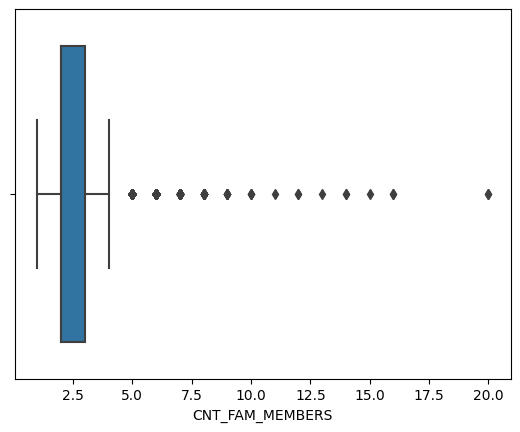

In [383]:
sns.boxplot(x=df_app['CNT_FAM_MEMBERS'])

---->>> The data is right skewed. And we have to fill whole number in places of null values. So we are filling null values with median for this column.

In [384]:
df_app['CNT_FAM_MEMBERS'].isnull().sum()

2

In [385]:
# filling the missing values with median value.
df_app['CNT_FAM_MEMBERS'].fillna(df_app['CNT_FAM_MEMBERS'].median(), inplace=True)

In [386]:
df_app['CNT_FAM_MEMBERS'].isnull().sum()

0

In [387]:
df_app['CNT_FAM_MEMBERS'].shape

(307510,)

Removing outlier(value > 17)

In [388]:
df_app = df_app[df_app['CNT_FAM_MEMBERS'] <= 17]

In [389]:
df_app['CNT_FAM_MEMBERS'].shape

(307508,)

---->>> After removing outliers we have 307508 rows from 307510.

#### 6. df_app['OBS_30_CNT_SOCIAL_CIRCLE'] = How many observation of client's social surroundings with observable 30 DPD (days past due) default.

In [390]:
df_app['OBS_30_CNT_SOCIAL_CIRCLE'].describe()

count    306487.000000
mean          1.422253
std           2.400999
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [391]:
df_app['OBS_30_CNT_SOCIAL_CIRCLE'].value_counts()

0.0      163909
1.0       48781
2.0       29808
3.0       20322
4.0       14143
5.0        9553
6.0        6453
7.0        4390
8.0        2967
9.0        2003
10.0       1376
11.0        852
12.0        652
13.0        411
14.0        258
15.0        166
16.0        133
17.0         88
18.0         46
19.0         44
20.0         30
21.0         29
22.0         22
23.0         15
25.0         11
24.0         11
27.0          5
26.0          3
30.0          2
28.0          1
29.0          1
47.0          1
348.0         1
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

<AxesSubplot:xlabel='OBS_30_CNT_SOCIAL_CIRCLE', ylabel='Density'>

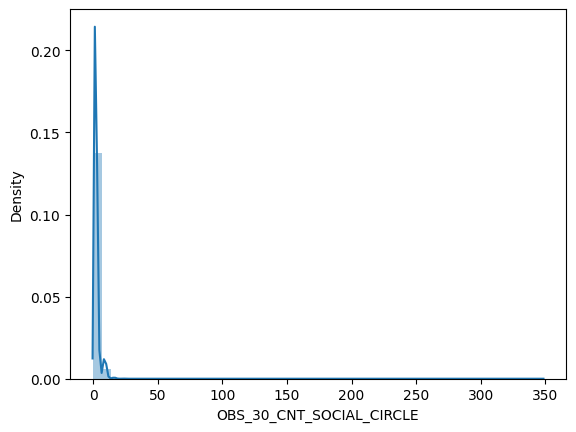

In [392]:
sns.distplot(df_app['OBS_30_CNT_SOCIAL_CIRCLE'])

---->>> In this case more than 50% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [393]:
df_app['OBS_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

In [394]:
# filling the missing values with median value.
df_app['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(df_app['OBS_30_CNT_SOCIAL_CIRCLE'].median(), inplace=True)

In [395]:
df_app['OBS_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

0

#### 7. df_app['DEF_30_CNT_SOCIAL_CIRCLE'] = How many observation of client's social surroundings defaulted on 30 DPD (days past due) .

In [396]:
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].describe()

count    306487.000000
mean          0.143419
std           0.446698
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          34.000000
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

<AxesSubplot:xlabel='DEF_30_CNT_SOCIAL_CIRCLE', ylabel='Density'>

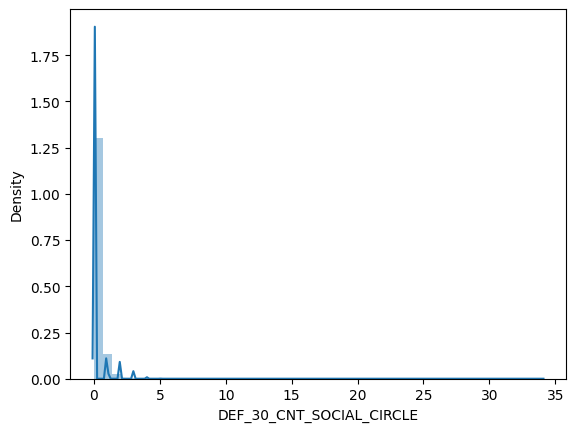

In [397]:
sns.distplot(df_app['DEF_30_CNT_SOCIAL_CIRCLE'])

<AxesSubplot:xlabel='DEF_30_CNT_SOCIAL_CIRCLE'>

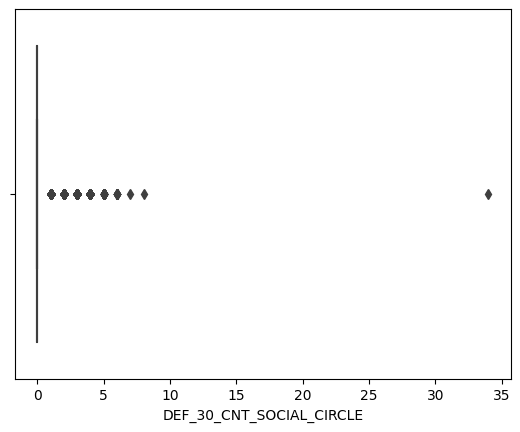

In [398]:
sns.boxplot(x=df_app['DEF_30_CNT_SOCIAL_CIRCLE'])

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [399]:
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

In [400]:
# filling the missing values with median value.
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(df_app['DEF_30_CNT_SOCIAL_CIRCLE'].median(), inplace=True)

In [401]:
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].isnull().sum()

0

In [402]:
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].shape

(307508,)

Removing outlier (value > 15)

In [403]:
df_app = df_app[df_app['DEF_30_CNT_SOCIAL_CIRCLE'] < 15]

In [404]:
df_app['DEF_30_CNT_SOCIAL_CIRCLE'].shape

(307507,)

#### 8. df_app['OBS_60_CNT_SOCIAL_CIRCLE'] = How many observation of client's social surroundings with observable 60 DPD (days past due) default.

In [405]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].describe()

count    306486.000000
mean          1.404182
std           2.297949
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max          47.000000
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [406]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].value_counts()

0.0     164665
1.0      48868
2.0      29766
3.0      20215
4.0      13946
5.0       9463
6.0       6349
7.0       4344
8.0       2886
9.0       1959
10.0      1335
11.0       837
12.0       620
13.0       401
14.0       238
15.0       166
16.0       137
17.0        73
18.0        49
19.0        44
20.0        30
21.0        28
22.0        20
23.0        13
24.0        12
25.0        11
27.0         5
29.0         2
28.0         1
47.0         1
30.0         1
26.0         1
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

<AxesSubplot:xlabel='OBS_60_CNT_SOCIAL_CIRCLE'>

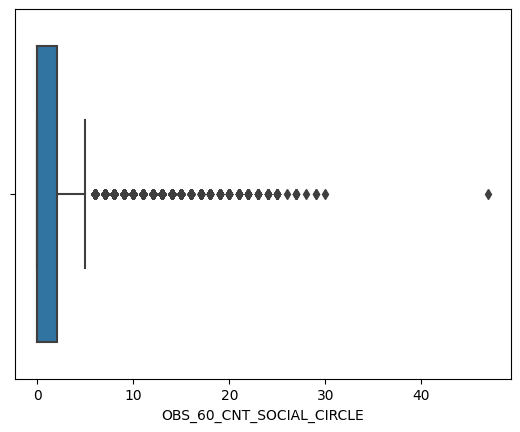

In [407]:
sns.boxplot(x=df_app['OBS_60_CNT_SOCIAL_CIRCLE'])

---->>> In this case more than 50% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [408]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

In [409]:
# filling the missing values with median value.
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(df_app['OBS_60_CNT_SOCIAL_CIRCLE'].median(), inplace=True)

In [410]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

0

In [411]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].shape

(307507,)

Outlier treatment(value > 35)

In [412]:
df_app = df_app[df_app['OBS_60_CNT_SOCIAL_CIRCLE'] < 35]

In [413]:
df_app['OBS_60_CNT_SOCIAL_CIRCLE'].shape

(307506,)

#### 9. df_app['DEF_60_CNT_SOCIAL_CIRCLE'] = How many observation of client's social surroundings defaulted on 60 (days past due) DPD.

In [414]:
df_app['DEF_60_CNT_SOCIAL_CIRCLE'].describe()

count    306485.000000
mean          0.099969
std           0.359709
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           7.000000
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [415]:
df_app['DEF_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

1021

In [416]:
# filling the missing values with median value.
df_app['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(df_app['DEF_60_CNT_SOCIAL_CIRCLE'].median(), inplace=True)

In [417]:
df_app['DEF_60_CNT_SOCIAL_CIRCLE'].isnull().sum()

0

#### 10. df_app['DAYS_LAST_PHONE_CHANGE'] = How many days before application did client change phone.

In [418]:
df_app['DAYS_LAST_PHONE_CHANGE'].describe()

count    307505.000000
mean        962.861726
std         826.806699
min           0.000000
25%         274.000000
50%         757.000000
75%        1570.000000
max        4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [419]:
df_app['DAYS_LAST_PHONE_CHANGE'].value_counts()

0.0       37671
1.0        2812
2.0        2318
3.0        1763
4.0        1285
          ...  
4051.0        1
3593.0        1
3622.0        1
3570.0        1
3538.0        1
Name: DAYS_LAST_PHONE_CHANGE, Length: 3773, dtype: int64

---->>> So it appears that '0' is mode value here. We can replace null values with '0' for this column.

In [420]:
df_app['DAYS_LAST_PHONE_CHANGE'].isnull().sum()

1

In [421]:
# filling the missing values with mode value.
df_app['DAYS_LAST_PHONE_CHANGE'].fillna(df_app['DAYS_LAST_PHONE_CHANGE'].mode()[0],inplace=True)

In [422]:
df_app['DAYS_LAST_PHONE_CHANGE'].isnull().sum()

0

#### 11. df_app['AMT_REQ_CREDIT_BUREAU_HOUR'] = Number of enquiries to Credit Bureau about the client one hour before application.

In [423]:
df_app['AMT_REQ_CREDIT_BUREAU_HOUR'].describe()

count    265987.000000
mean          0.006403
std           0.083850
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           4.000000
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: float64

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [424]:
df_app['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()

41519

In [425]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_HOUR'].median(), inplace=True)

In [426]:
df_app['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()

0

#### 12. df_app['AMT_REQ_CREDIT_BUREAU_DAY'] = Number of enquiries to Credit Bureau about the client one day before application (excluding one hour before application).

In [427]:
df_app['AMT_REQ_CREDIT_BUREAU_DAY'].describe()

count    265987.000000
mean          0.007000
std           0.110758
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           9.000000
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: float64

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_DAY'>

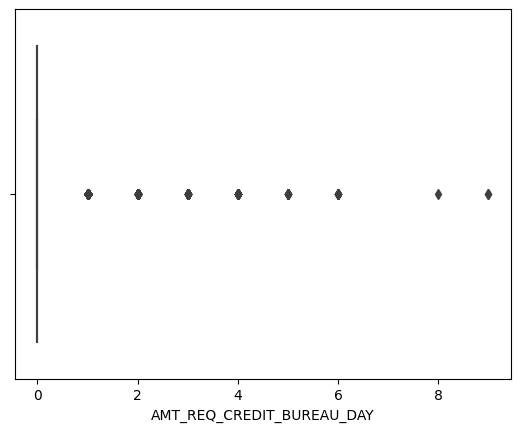

In [428]:
sns.boxplot(x=df_app['AMT_REQ_CREDIT_BUREAU_DAY'])

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [429]:
df_app['AMT_REQ_CREDIT_BUREAU_DAY'].isnull().sum()

41519

In [430]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_DAY'].median(), inplace=True)

In [431]:
df_app['AMT_REQ_CREDIT_BUREAU_DAY'].isnull().sum()

0

Removing outlier(value > 6)

In [432]:
df_app = df_app[df_app['AMT_REQ_CREDIT_BUREAU_DAY'] <= 6]

#### 13. df_app['AMT_REQ_CREDIT_BUREAU_WEEK'] = Number of enquiries to Credit Bureau about the client one week before application (excluding one day before application).

In [433]:
df_app['AMT_REQ_CREDIT_BUREAU_WEEK'].describe()

count    265984.000000
mean          0.034329
std           0.204096
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           8.000000
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: float64

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [434]:
df_app['AMT_REQ_CREDIT_BUREAU_WEEK'].isnull().sum()

41519

In [435]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_WEEK'].median(), inplace=True)

In [436]:
df_app['AMT_REQ_CREDIT_BUREAU_WEEK'].isnull().sum()

0

#### 14. df_app['AMT_REQ_CREDIT_BUREAU_MON'] = Number of enquiries to Credit Bureau about the client one month before application (excluding one week before application).

In [437]:
df_app['AMT_REQ_CREDIT_BUREAU_MON'].describe()

count    265984.000000
mean          0.267400
std           0.916014
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          27.000000
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: float64

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_MON'>

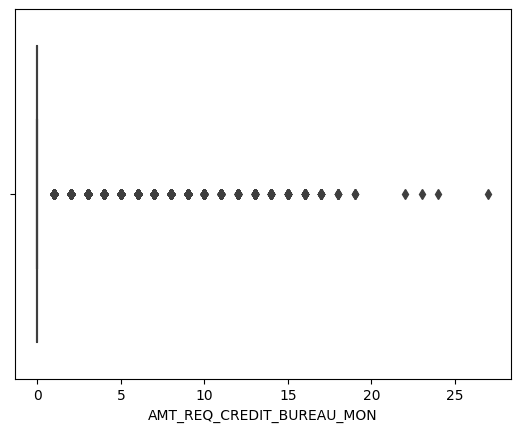

In [438]:
sns.boxplot(x=df_app['AMT_REQ_CREDIT_BUREAU_MON'])

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [439]:
df_app['AMT_REQ_CREDIT_BUREAU_MON'].isnull().sum()

41519

In [440]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_MON'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_MON'].median(), inplace=True)

In [441]:
df_app['AMT_REQ_CREDIT_BUREAU_MON'].isnull().sum()

0

In [442]:
df_app['AMT_REQ_CREDIT_BUREAU_MON'].shape

(307503,)

Outlier removal (value > 20)

In [443]:
df_app = df_app[df_app['AMT_REQ_CREDIT_BUREAU_MON'] <= 20]

In [444]:
df_app['AMT_REQ_CREDIT_BUREAU_MON'].shape

(307499,)

---->>> After removing outliers we have 307499 rows from 307503.

#### 15. df_app['AMT_REQ_CREDIT_BUREAU_QRT'] = Number of enquiries to Credit Bureau about the client 3 month before application (excluding one month before application).

In [445]:
df_app['AMT_REQ_CREDIT_BUREAU_QRT'].describe()

count    265980.000000
mean          0.265471
std           0.794058
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         261.000000
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_QRT'>

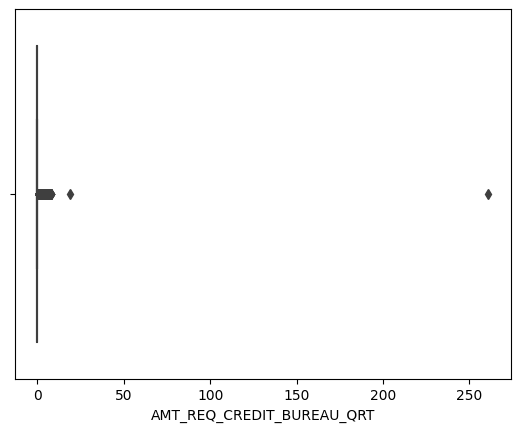

In [446]:
sns.boxplot(x=df_app['AMT_REQ_CREDIT_BUREAU_QRT'])

---->>> In this case more than 75% values are '0', so we can fill median / mode(median = mode = '0') in places of null values.

In [447]:
df_app['AMT_REQ_CREDIT_BUREAU_QRT'].isnull().sum()

41519

In [448]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_QRT'].median(), inplace=True)

In [449]:
df_app['AMT_REQ_CREDIT_BUREAU_QRT'].isnull().sum()

0

Removing outlier(value > 50)

In [450]:
df_app = df_app[df_app['AMT_REQ_CREDIT_BUREAU_QRT'] < 50]

#### 16. df_app['AMT_REQ_CREDIT_BUREAU_YEAR'] = Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application).

In [451]:
df_app['AMT_REQ_CREDIT_BUREAU_YEAR'].describe()

count    265979.000000
mean          1.899958
std           1.869263
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max          25.000000
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_YEAR'>

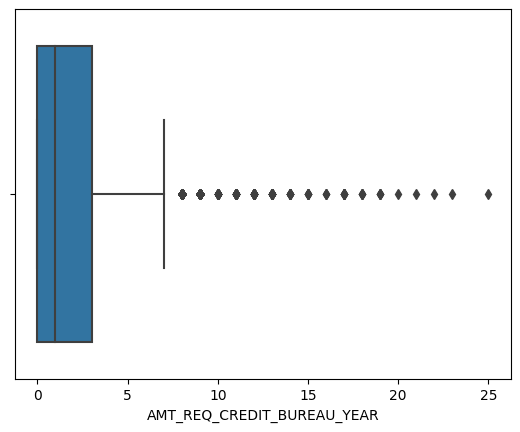

In [452]:
sns.boxplot(x=df_app['AMT_REQ_CREDIT_BUREAU_YEAR'])

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_YEAR', ylabel='Density'>

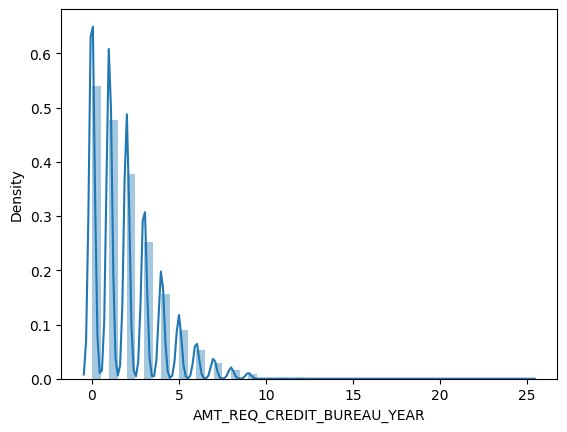

In [453]:
sns.distplot(df_app['AMT_REQ_CREDIT_BUREAU_YEAR'])

---->>> The data is right skewed. So we are filling null values with median for this column.

In [454]:
df_app['AMT_REQ_CREDIT_BUREAU_YEAR'].isnull().sum()

41519

In [455]:
# filling the missing values with median value.
df_app['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(df_app['AMT_REQ_CREDIT_BUREAU_YEAR'].median(), inplace=True)

In [456]:
df_app['AMT_REQ_CREDIT_BUREAU_YEAR'].isnull().sum()

0

## Univariate analysis of 'application_data.csv'

### Categorical columns - 

In [457]:
categorical_col_app = df_app.select_dtypes(include=['object']).columns.tolist() 
categorical_col_app

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [458]:
for i in categorical_col_app:
    print(f'-----------{i}------------')
    print(df_app[i].value_counts(normalize=True))
    print('-----------------------------------')

-----------NAME_CONTRACT_TYPE------------
Cash loans         0.904786
Revolving loans    0.095214
Name: NAME_CONTRACT_TYPE, dtype: float64
-----------------------------------
-----------CODE_GENDER------------
F      0.658349
M      0.341638
XNA    0.000013
Name: CODE_GENDER, dtype: float64
-----------------------------------
-----------FLAG_OWN_CAR------------
N    0.6599
Y    0.3401
Name: FLAG_OWN_CAR, dtype: float64
-----------------------------------
-----------FLAG_OWN_REALTY------------
Y    0.693673
N    0.306327
Name: FLAG_OWN_REALTY, dtype: float64
-----------------------------------
-----------NAME_TYPE_SUITE------------
Unaccompanied      0.812396
Family             0.130554
Spouse, partner    0.036976
Children           0.010624
Other_B            0.005753
Other_A            0.002816
Group of people    0.000881
Name: NAME_TYPE_SUITE, dtype: float64
-----------------------------------
-----------NAME_INCOME_TYPE------------
Working                 0.516325
Commercial associa

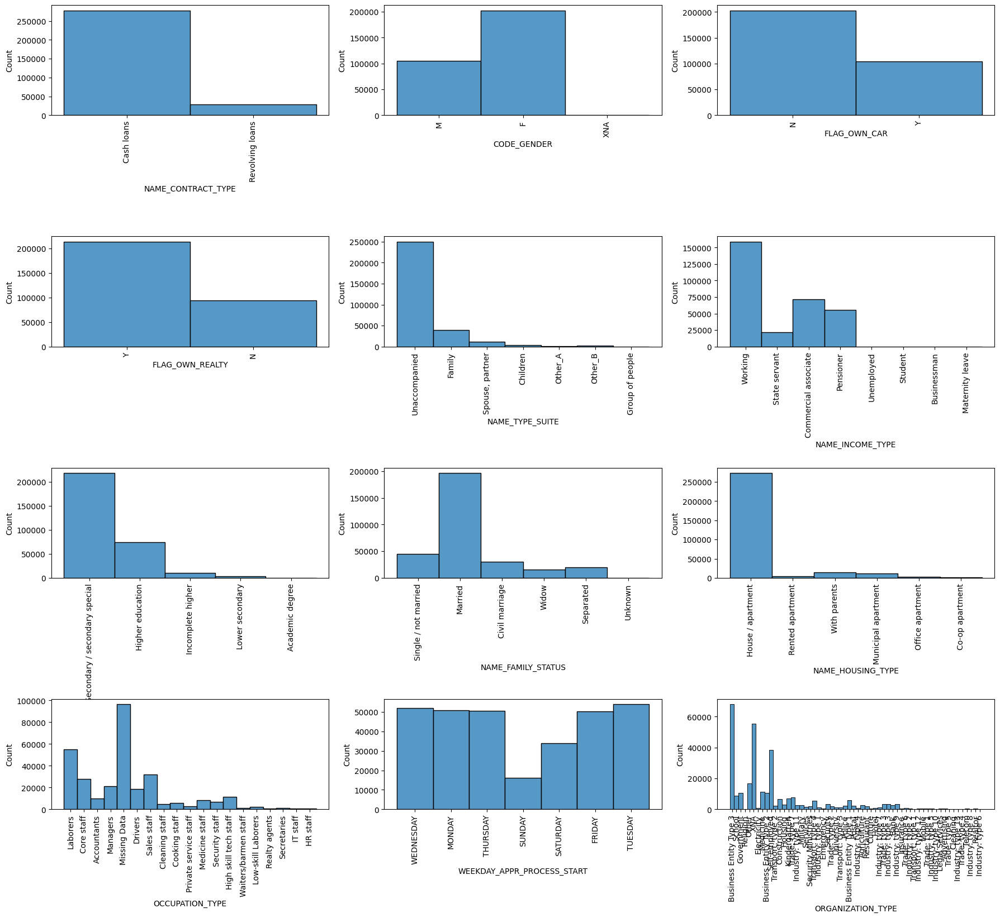

In [459]:
plt.figure(figsize=(25,18))
for i,j in zip(categorical_col_app,range(len(categorical_col_app))): 
    plt.subplot(4,3,j+1) 
    sns.histplot(df_app[i])
    plt.xticks(rotation=90)
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=1.1)
plt.show()

### Observations ---->>>

1. Cash loans are the highest in 90% cases with nearly ten times lower Revolving loans in 9% cases.
2. 202441 females applied for loan are nearly twice than male applicants with 105053 loan applications.
3. Clients who owns car are 34% which is approximately half than who doesn't own the car(66% cases).
4. 213303 clients own a house or flat and 94195 clients doesn't own it.
5. The client was unaccompanied in highest 81% cases and was with group of people in least 0.08% cases.
6. Nearly half of the applicants are working(51%).
7. Most of the clients(71%) are having highest education of Secondary/secondary special and only 0.05% clients have academic degree.
8. 63% clients are married and 14% are single followed by Civil marriage, Separated, Widow.
9. 88% clients have houses/apartments and 4% clients are living with parents followed by municipal,rented,office & co-op apartment in least cases.
10. 31% data is missing regarding the occupation of client.Next highest clients are laborers(17%) and least are IT staff in 0.1%.
11. The client applied for loan on every day of the week with approximately same frequency except Saturday & Sunday. 
12. 22% clients work in Business entity type 3 organization followed by XNA and 12% clients are self-employed.

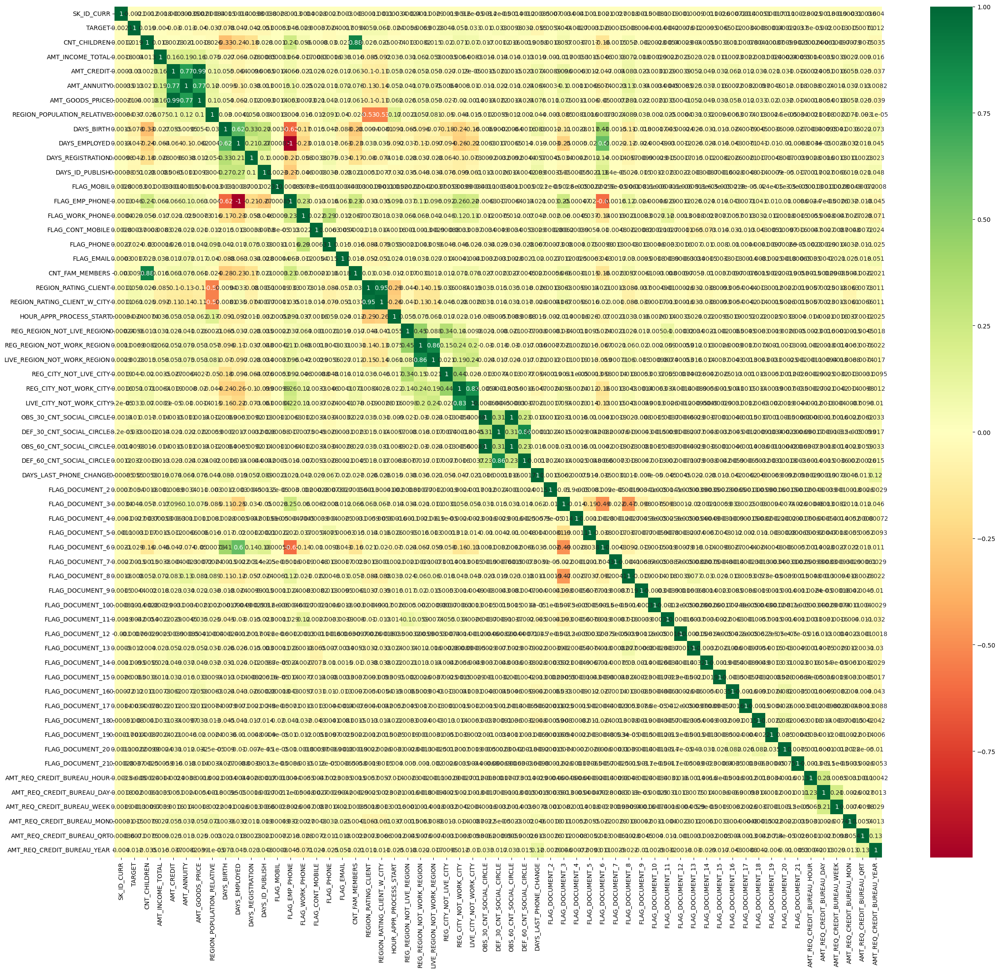

In [460]:
plt.figure(figsize=(28,25))
sns.heatmap(data= df_app.corr(), cmap='RdYlGn',annot=True)
plt.show()

## Merging two datafiles into one on 'SK_ID_CURR' column.

In [461]:
# Merging two dataframes into 'combined_df'.
combined_df = pd.merge(df_app,df_pre, on='SK_ID_CURR', how='inner')

In [462]:
combined_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest


In [463]:
combined_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START_x', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', '

In [464]:
combined_df.shape

(1413536, 96)

#### Sorting combined_df 

In [465]:
combined_df.sort_values(by=['SK_ID_CURR','SK_ID_PREV'], ascending=[True,True], inplace=True)

#### Dropping duplicates from combined_df

In [466]:
combined_df.drop_duplicates(subset='SK_ID_CURR', keep='last', inplace=True)
combined_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.000000,low_normal,POS other with interest
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.000000,middle,POS industry with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.000000,middle,POS mobile without interest
6,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,16.054017,XNA,Card Street
15,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),4,XNA,48.000000,middle,Cash X-Sell: middle


In [467]:
combined_df.shape

(291046, 96)

#### After sorting and dropping duplicates we have 291046 rows from 1413536 rows and 96 columns.

### Finding the ratio of data imbalance

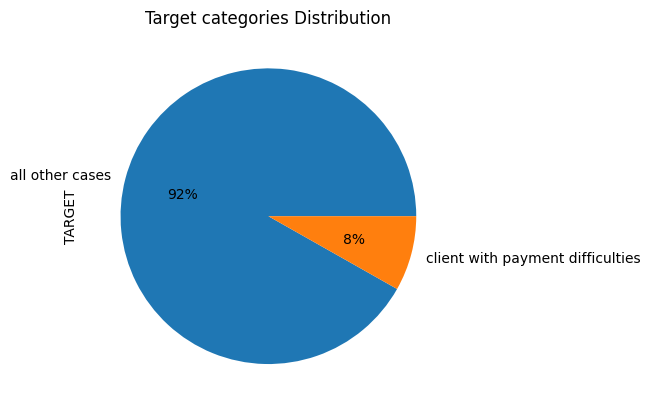

In [468]:
combined_df['TARGET'].value_counts().plot.pie(labels=['all other cases','client with payment difficulties'],autopct='%1.0f%%') # autopct='%1.0f%%' -- source- stack overflow
plt.title('Target categories Distribution')
plt.show()

---->>> Clients with payment difficulties are 8% out of total.

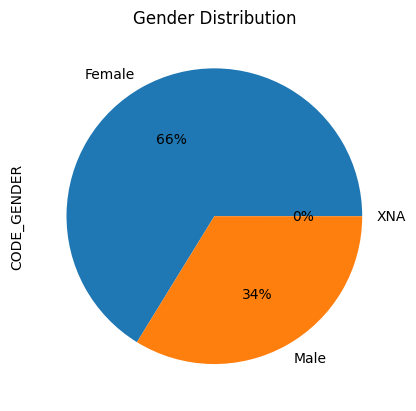

In [469]:
combined_df['CODE_GENDER'].value_counts().plot.pie(labels=['Female','Male','XNA'],autopct='%1.0f%%')
plt.title('Gender Distribution')
plt.show()

---->>> 66% females applied for loan and 34% males applied for the loan.

In [470]:
combined_df.groupby(['TARGET'])['CODE_GENDER'].value_counts()

TARGET  CODE_GENDER
0       F              179115
        M               88082
        XNA                 4
1       F               13644
        M               10201
Name: CODE_GENDER, dtype: int64

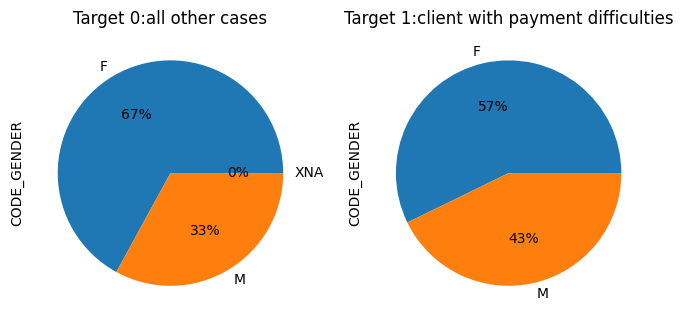

In [471]:
plt.figure(figsize=(8,6))
plt.subplot(1,2,1)
combined_df.groupby(['TARGET'])['CODE_GENDER'].value_counts()[0].plot.pie(autopct='%1.0f%%')
plt.title('Target 0:all other cases')
plt.subplot(1,2,2)
combined_df.groupby(['TARGET'])['CODE_GENDER'].value_counts()[1].plot.pie(autopct='%1.0f%%')
plt.title('Target 1:client with payment difficulties')
plt.show()

Subplot 1 - 67% females & 33% males are from Target '0' category i.e. all other cases.    
Subplot 2 - 57% females & 43% males are from Target '1' category i.e. client with payment difficulties.          

In [472]:
combined_df.groupby(['TARGET'])['FLAG_OWN_CAR'].value_counts()

TARGET  FLAG_OWN_CAR
0       N               176013
        Y                91188
1       N                16538
        Y                 7307
Name: FLAG_OWN_CAR, dtype: int64

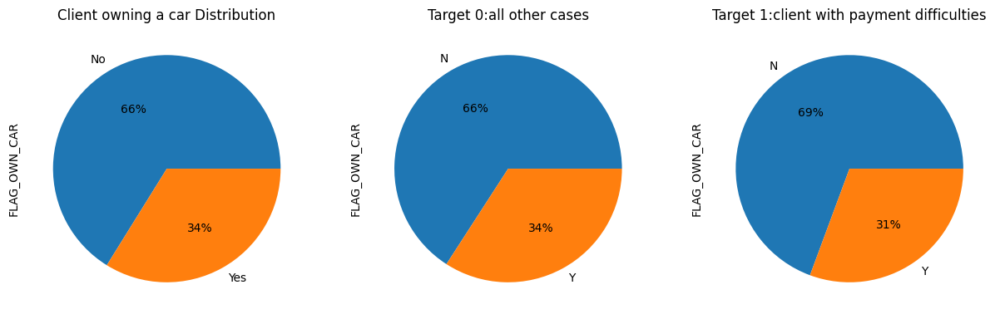

In [473]:
plt.figure(figsize=(15,8))
plt.subplot(1,3,1)
combined_df['FLAG_OWN_CAR'].value_counts().plot.pie(labels=['No','Yes'],autopct='%1.0f%%')
plt.title('Client owning a car Distribution')
plt.subplot(1,3,2)
combined_df.groupby(['TARGET'])['FLAG_OWN_CAR'].value_counts()[0].plot.pie(autopct='%1.0f%%')
plt.title('Target 0:all other cases')
plt.subplot(1,3,3)
combined_df.groupby(['TARGET'])['FLAG_OWN_CAR'].value_counts()[1].plot.pie(autopct='%1.0f%%')
plt.title('Target 1:client with payment difficulties')
plt.show()

Subplot 1 - 34% clients own a car and 66% doesn't out of total clients.                          
Subplot 2 - In target '0' category, 66% clients doesn't own a car & 34% owns it.   
Subplot 3 - In target '1' category, 69% clients doesn't own a car & 31% owns it. 

In [474]:
combined_df.groupby(['TARGET'])['FLAG_OWN_REALTY'].value_counts()

TARGET  FLAG_OWN_REALTY
0       Y                  189208
        N                   77993
1       Y                   16516
        N                    7329
Name: FLAG_OWN_REALTY, dtype: int64

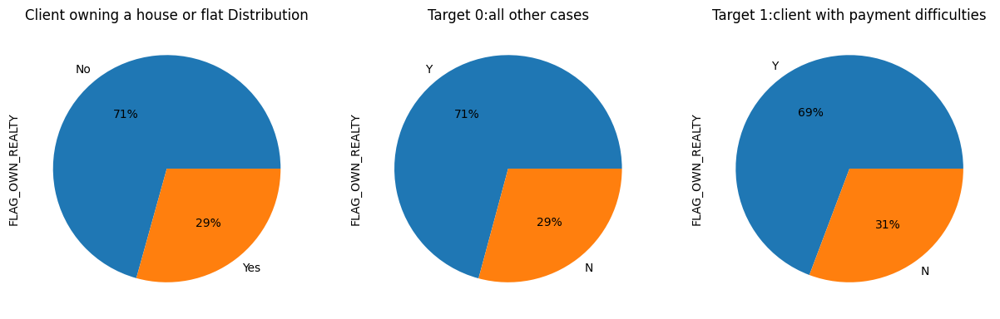

In [475]:
plt.figure(figsize=(15,8))
plt.subplot(1,3,1)
combined_df['FLAG_OWN_REALTY'].value_counts().plot.pie(labels=['No','Yes'],autopct='%1.0f%%')
plt.title('Client owning a house or flat Distribution')
plt.subplot(1,3,2)
combined_df.groupby(['TARGET'])['FLAG_OWN_REALTY'].value_counts()[0].plot.pie(autopct='%1.0f%%')
plt.title('Target 0:all other cases')
plt.subplot(1,3,3)
combined_df.groupby(['TARGET'])['FLAG_OWN_REALTY'].value_counts()[1].plot.pie(autopct='%1.0f%%')
plt.title('Target 1:client with payment difficulties')
plt.show()

Subplot 1 - 29% clients own a house or flat and 71% doesn't out of total clients.                          
Subplot 2 - In target '0' category, 29% clients doesn't own a house or flat & 71% owns it.   
Subplot 3 - In target '1' category, 31% clients doesn't own a house or flat & 69% owns it.

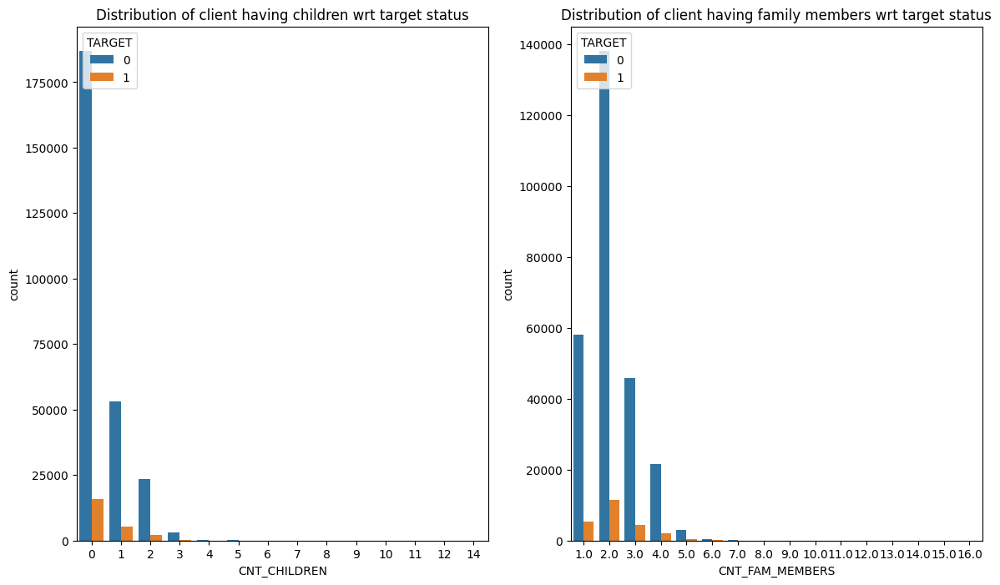

In [476]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
sns.countplot(combined_df['CNT_CHILDREN'], hue=combined_df['TARGET'])
plt.title('Distribution of client having children wrt target status')
plt.subplot(1,2,2)
sns.countplot(combined_df['CNT_FAM_MEMBERS'], hue=combined_df['TARGET'])
plt.title('Distribution of client having family members wrt target status')
plt.show()

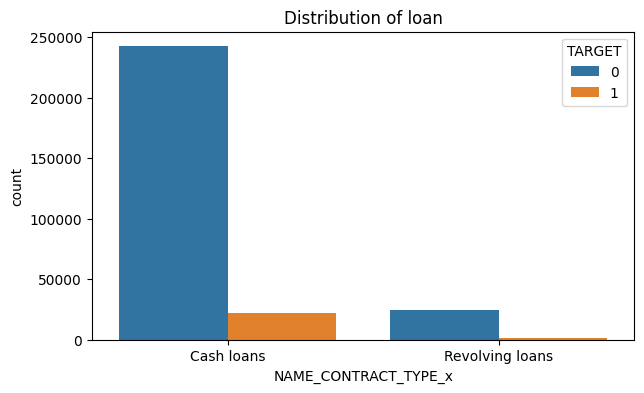

In [477]:
plt.figure(figsize=(7,4))
sns.countplot(combined_df['NAME_CONTRACT_TYPE_x'], hue=combined_df['TARGET'])
plt.title('Distribution of loan')
plt.show()

---->>> In both the Target categories 'cash' loans are way more than 'revolving' loans.

<AxesSubplot:xlabel='TARGET'>

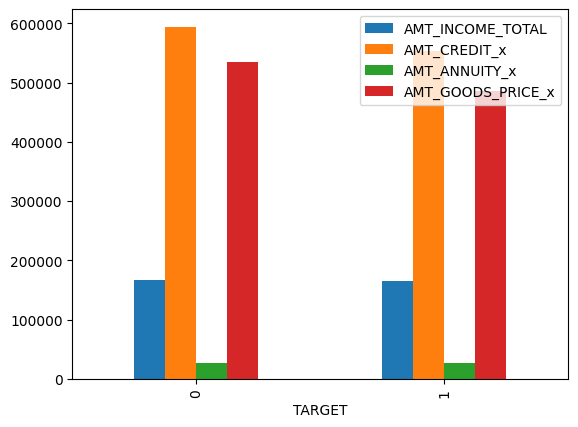

In [478]:
combined_df.groupby(['TARGET'])['AMT_INCOME_TOTAL','AMT_CREDIT_x','AMT_ANNUITY_x','AMT_GOODS_PRICE_x'].mean().plot.bar()

1. Income of client in both the target categories is almost similar.
2. Credit amount is higher in target '0' category.

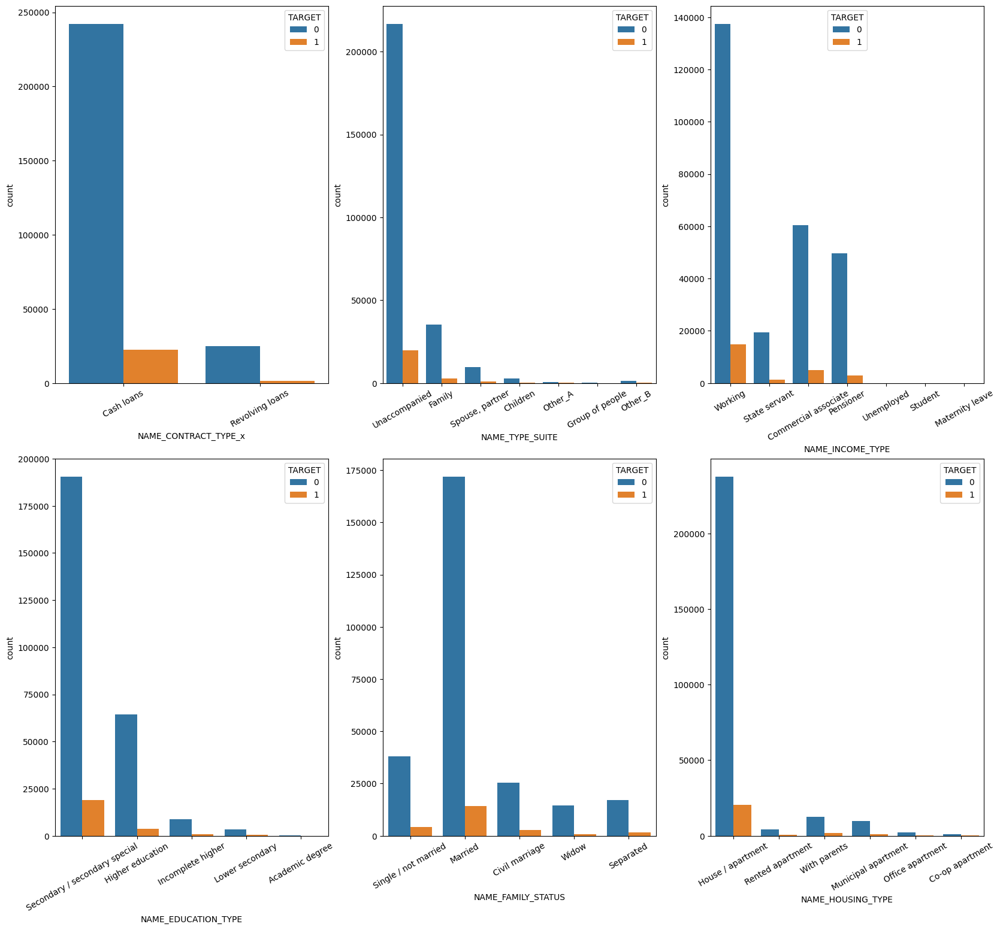

In [479]:
cols = ['NAME_CONTRACT_TYPE_x','NAME_TYPE_SUITE','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE']

plt.figure(figsize=(20,18))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(2,3,j+1) 
    sns.countplot(combined_df[i], hue=combined_df['TARGET']) 
    plt.xticks(rotation=30)
plt.show()

Subplot 1 - In both the Target categories 'cash' loans are way more than 'revolving' loans.                          
Subplot 2 - In both the Target categories clients were 'Unaccompanied' in highest number of cases.   
Subplot 3 - In both the Target categories 'working' is the income type of highest number of clients.            
Subplot 4 - Most of the clients from both target categories are having highest education of Secondary/secondary special.                          
Subplot 5 - Highest number of clients are married in both target categories.   
Subplot 6 - Clients have house/apartment in most cases in both target categories.

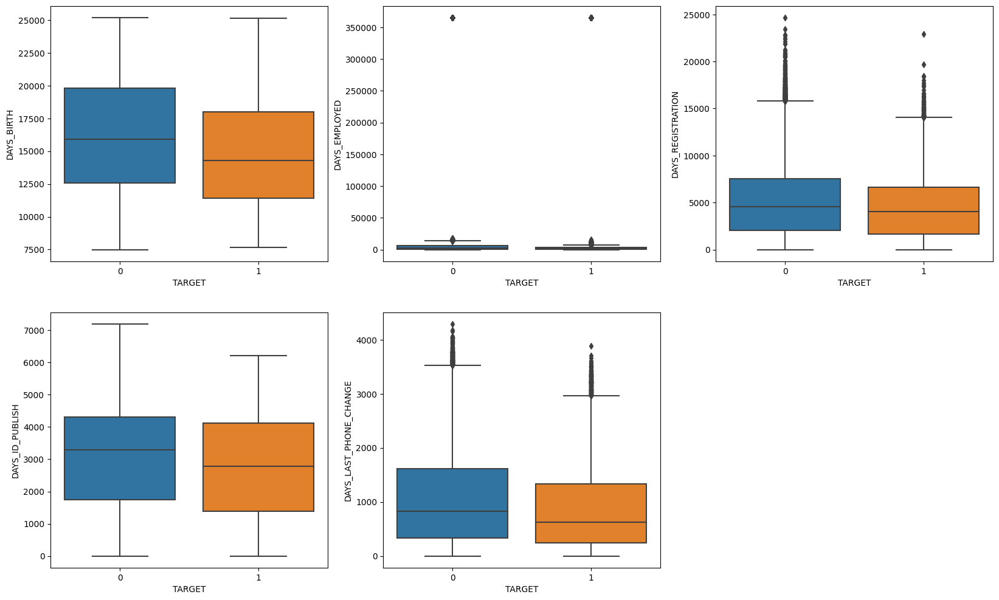

In [480]:
cols = ['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE']

plt.figure(figsize=(20,12))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(2,3,j+1) 
    sns.boxplot(combined_df['TARGET'], combined_df[i]) 
plt.show()

Subplot 1 - Age distribution of clients in both target categories.                          
Subplot 2 - How many days before the application the person started current employment.   
Subplot 3 - How many days before the application did client change his registration.                          
Subplot 4 - How many days before the application did client change the identity document with which he applied for the loan.                          
Subplot 5 - How many days before application did client change phone.   

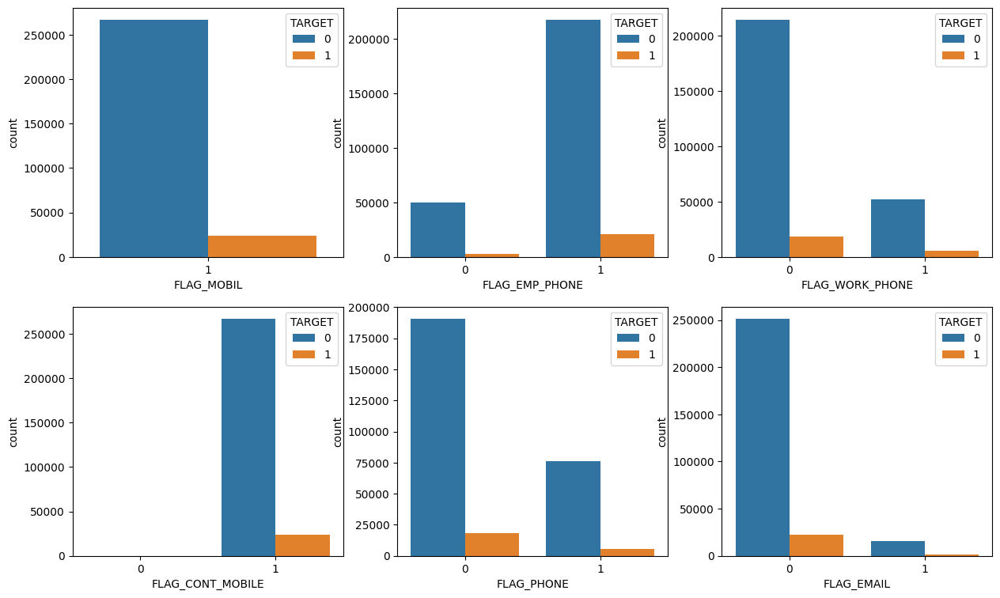

In [481]:
cols = ['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL']

plt.figure(figsize=(15,9))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(2,3,j+1) 
    sns.countplot(combined_df[i], hue=combined_df['TARGET'])
plt.show()

Subplot 1 - Did client provide mobile phone (1=YES, 0=NO).                          
Subplot 2 - Did client provide work phone (1=YES, 0=NO).   
Subplot 3 - Did client provide home phone (1=YES, 0=NO).                               
Subplot 4 - Was mobile phone reachable (1=YES, 0=NO).                          
Subplot 5 - Did client provide home phone (1=YES, 0=NO).   
Subplot 6 - Did client provide email (1=YES, 0=NO).

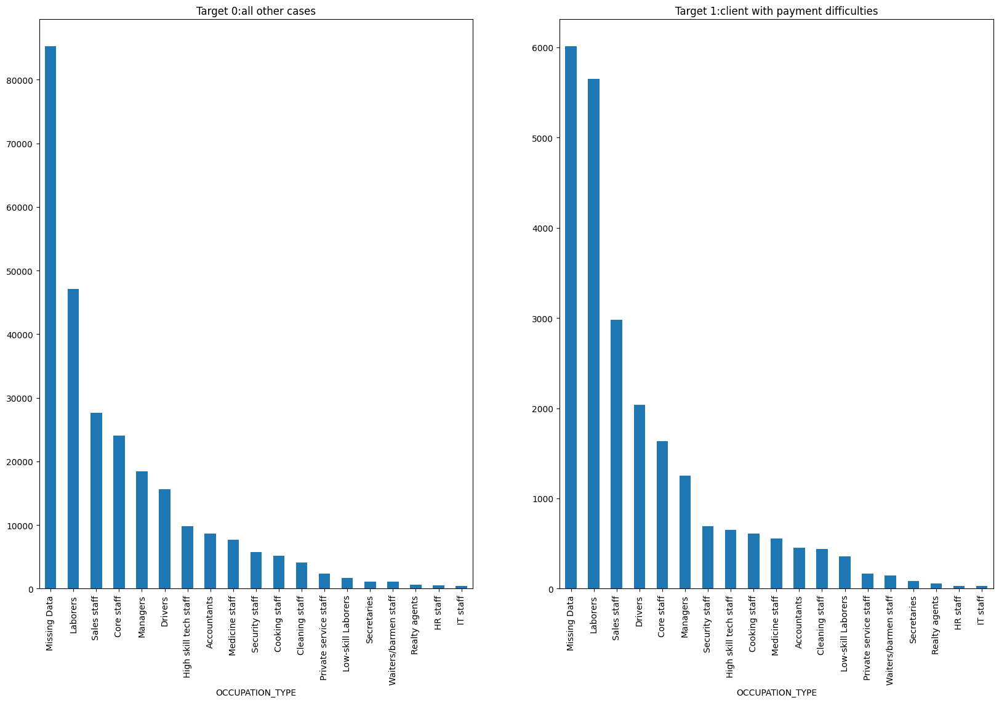

In [482]:
plt.figure(figsize=(20,12))
plt.subplot(1,2,1)
combined_df.groupby(['TARGET'])['OCCUPATION_TYPE'].value_counts()[0].plot.bar()
plt.title('Target 0:all other cases')
plt.subplot(1,2,2)
combined_df.groupby(['TARGET'])['OCCUPATION_TYPE'].value_counts()[1].plot.bar()
plt.title('Target 1:client with payment difficulties')
plt.show()

1. Data is missing in both the categories. 
2. Highest number of clients belong to 'Laborers' category in both target categories.

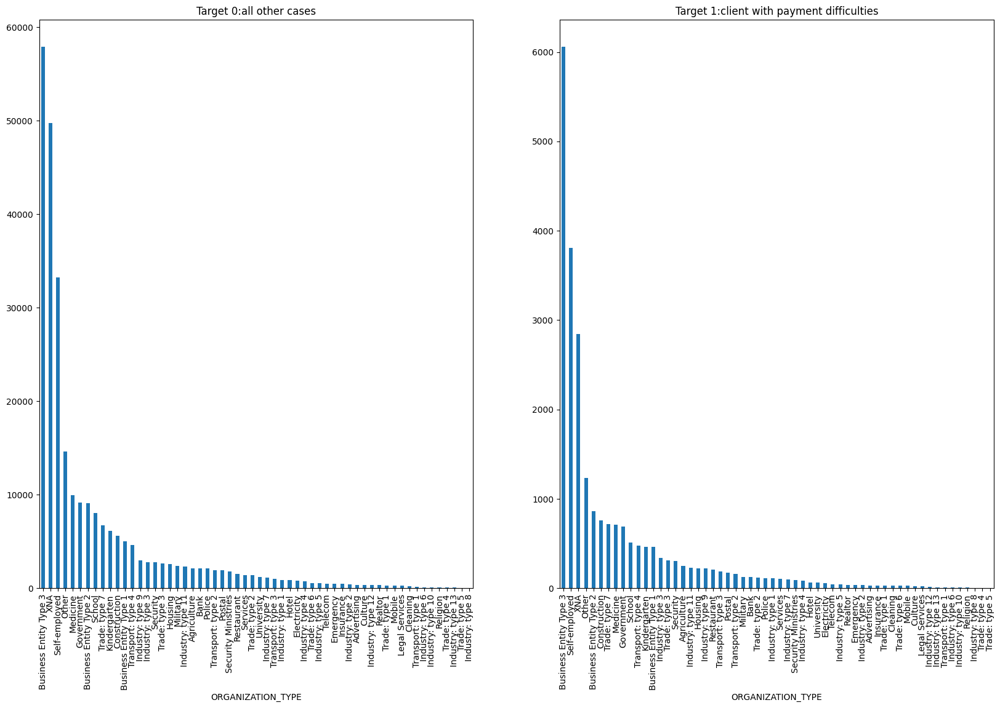

In [483]:
plt.figure(figsize=(20,12))
plt.subplot(1,2,1)
combined_df.groupby(['TARGET'])['ORGANIZATION_TYPE'].value_counts()[0].plot.bar()
plt.title('Target 0:all other cases')
plt.subplot(1,2,2)
combined_df.groupby(['TARGET'])['ORGANIZATION_TYPE'].value_counts()[1].plot.bar()
plt.title('Target 1:client with payment difficulties')
plt.show()

1. Data is missing(i.e. 'XNA' category) in both the categories. 
2. Highest number of clients belong to 'Business Entity Type 3' category in both target categories followed by 'Self-employed.

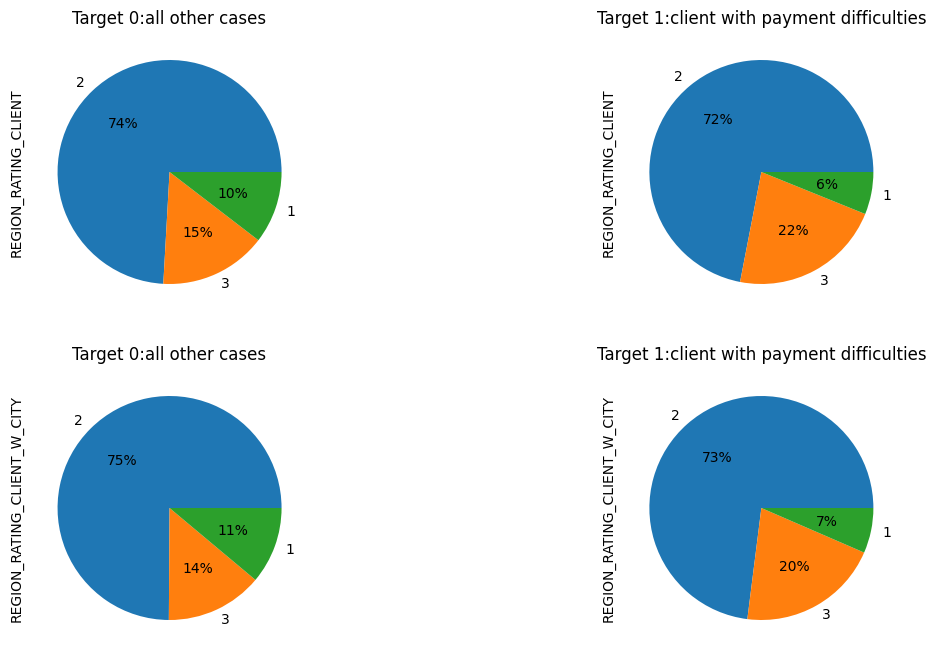

In [484]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
combined_df.groupby(['TARGET'])['REGION_RATING_CLIENT'].value_counts()[0].plot.pie(autopct='%1.0f%%')
plt.title('Target 0:all other cases')
plt.subplot(2,2,2)
combined_df.groupby(['TARGET'])['REGION_RATING_CLIENT'].value_counts()[1].plot.pie(autopct='%1.0f%%')
plt.title('Target 1:client with payment difficulties')
plt.subplot(2,2,3)
combined_df.groupby(['TARGET'])['REGION_RATING_CLIENT_W_CITY'].value_counts()[0].plot.pie(autopct='%1.0f%%')
plt.title('Target 0:all other cases')
plt.subplot(2,2,4)
combined_df.groupby(['TARGET'])['REGION_RATING_CLIENT_W_CITY'].value_counts()[1].plot.pie(autopct='%1.0f%%')
plt.title('Target 1:client with payment difficulties')
plt.show()

1. Percentage of clients with payment difficulties are less in rating 1 region(6% < 10%).
2. Percentage of clients with payment difficulties are more in rating 3 region(20% > 14%).

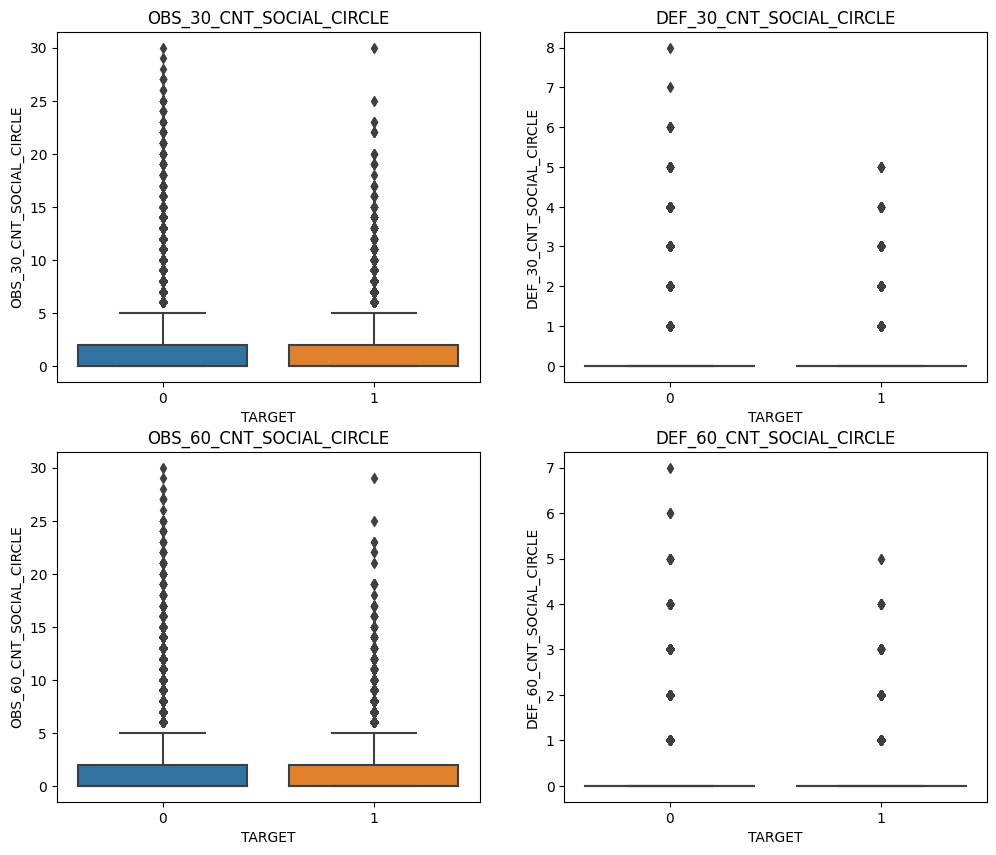

In [485]:
cols = ['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']

plt.figure(figsize=(12,10))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(2,2,j+1) 
    sns.boxplot(combined_df['TARGET'], combined_df[i])
    plt.title(i)
plt.show()

Subplot 1 - How many observation of client's social surroundings with observable 30 DPD (days past due) default.                          
Subplot 2 - How many observation of client's social surroundings defaulted on 30 DPD (days past due) .   
Subplot 3 - How many observation of client's social surroundings with observable 60 DPD (days past due) default.                          
Subplot 4 - How many observation of client's social surroundings defaulted on 60 (days past due) DPD.   

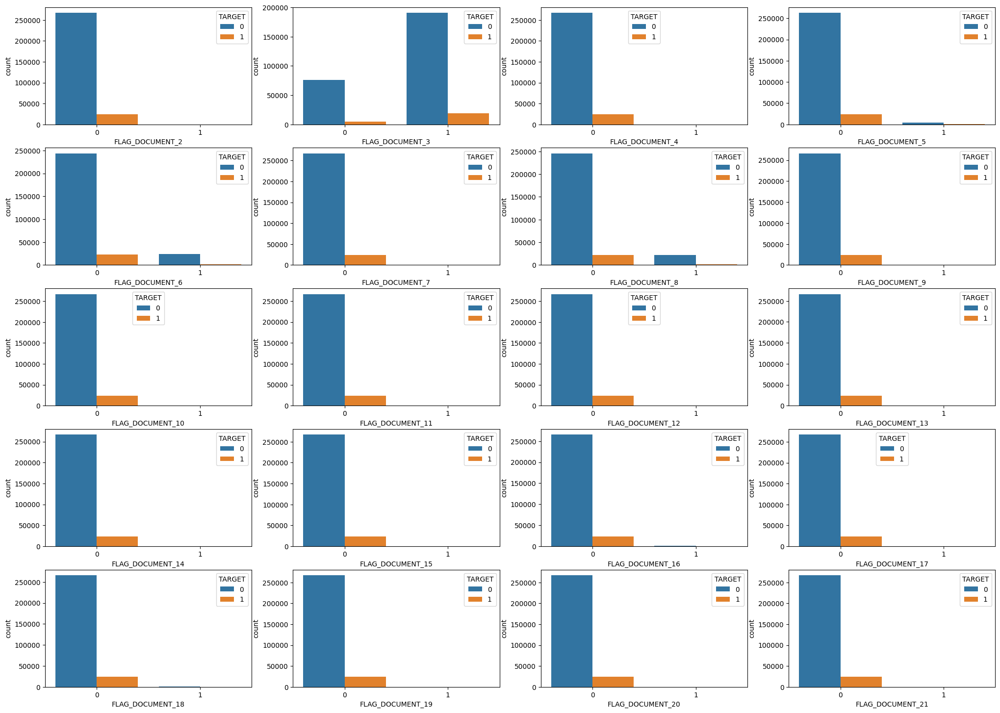

In [486]:
cols = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7',
        'FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13',
        'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18',
        'FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

plt.figure(figsize=(25,18))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(5,4,j+1) 
    sns.countplot(combined_df[i], hue=combined_df['TARGET'])
plt.show()

---->>> Distribution of clients provided documents.

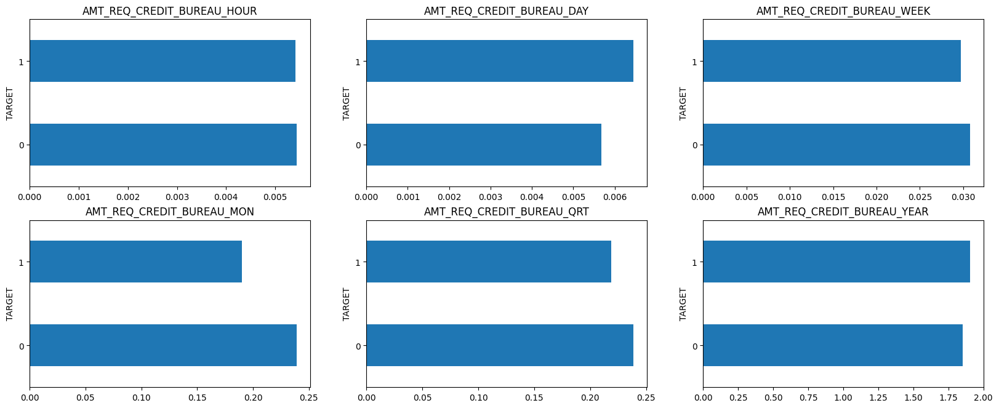

In [487]:
cols = ['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK',
        'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']

plt.figure(figsize=(20,12))
for i,j in zip(cols,range(len(cols))): 
    plt.subplot(3,3,j+1) 
    combined_df.groupby(['TARGET'])[i].mean().plot.barh() 
    plt.title(i)
plt.show()

Subplot 1 - Number of enquiries to Credit Bureau about the client one hour before application.                          
Subplot 2 - Number of enquiries to Credit Bureau about the client one day before application (excluding one hour before application).   
Subplot 3 - Number of enquiries to Credit Bureau about the client one week before application (excluding one day before application).                                    
Subplot 4 - Number of enquiries to Credit Bureau about the client one month before application (excluding one week before application).                          
Subplot 5 - Number of enquiries to Credit Bureau about the client 3 month before application (excluding one month before application).   
Subplot 6 - Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application).

## Finding the top correlation by segmenting the data frame with respect to the target variable.

In [488]:
# TARGET = 0 i.e. all other cases
df_0 = combined_df[combined_df['TARGET'] == 0]

In [489]:
# TARGET = 1 i.e. clients with payment difficulties
df_1 = combined_df[combined_df['TARGET'] == 1]

In [490]:
print(df_0.shape, df_1.shape)

(267201, 96) (23845, 96)


#### Correlation matrix of Target '0' dataframe - 

In [491]:
df_0.corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
SK_ID_CURR,1.000000,NaN,-0.001304,0.003299,-0.001034,-0.000488,-0.000937,-0.000099,0.001653,0.001582,...,0.002306,-0.002228,-0.002129,-0.001460,-0.002160,0.002392,-0.001718,0.002328,0.000472,-0.002120
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.001304,NaN,1.000000,0.029159,0.003723,0.021954,0.000356,-0.023392,-0.344227,-0.248927,...,-0.007230,-0.029423,-0.029988,-0.031904,-0.035346,0.010754,0.003379,0.002566,-0.001379,-0.038657
AMT_INCOME_TOTAL,0.003299,NaN,0.029159,1.000000,0.334901,0.407056,0.339205,0.156584,-0.059368,-0.141817,...,0.038413,0.201671,0.145997,0.145621,0.155862,0.085558,-0.003762,-0.007120,0.003813,0.034756
AMT_CREDIT_x,-0.001034,NaN,0.003723,0.334901,1.000000,0.768633,0.986700,0.093217,0.058429,-0.062245,...,0.003643,0.155370,0.129633,0.126830,0.133577,0.049286,-0.000771,0.058842,0.001710,0.038426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUR_APPR_PROCESS_START_y,0.002392,NaN,0.010754,0.085558,0.049286,0.061916,0.055726,0.165262,-0.131379,-0.113656,...,-0.045060,-0.019896,-0.011601,-0.019991,-0.023926,1.000000,0.006056,0.016686,0.011977,-0.042697
NFLAG_LAST_APPL_IN_DAY,-0.001718,NaN,0.003379,-0.003762,-0.000771,0.000294,0.000107,-0.001632,-0.002170,-0.000734,...,-0.015707,0.011251,0.005132,-0.023115,-0.004215,0.006056,1.000000,-0.018888,0.000714,0.050369
DAYS_DECISION,0.002328,NaN,0.002566,-0.007120,0.058842,0.034738,0.057115,0.021646,0.052942,-0.001897,...,-0.021824,-0.200770,-0.139011,-0.137216,-0.186433,0.016686,-0.018888,1.000000,0.006983,-0.201673
SELLERPLACE_AREA,0.000472,NaN,-0.001379,0.003813,0.001710,0.003692,0.002398,0.005120,-0.001480,0.000489,...,-0.008029,-0.006268,-0.003964,-0.005175,-0.006271,0.011977,0.000714,0.006983,1.000000,-0.002878


#### Correlation heatmap of Target '0' dataframe -

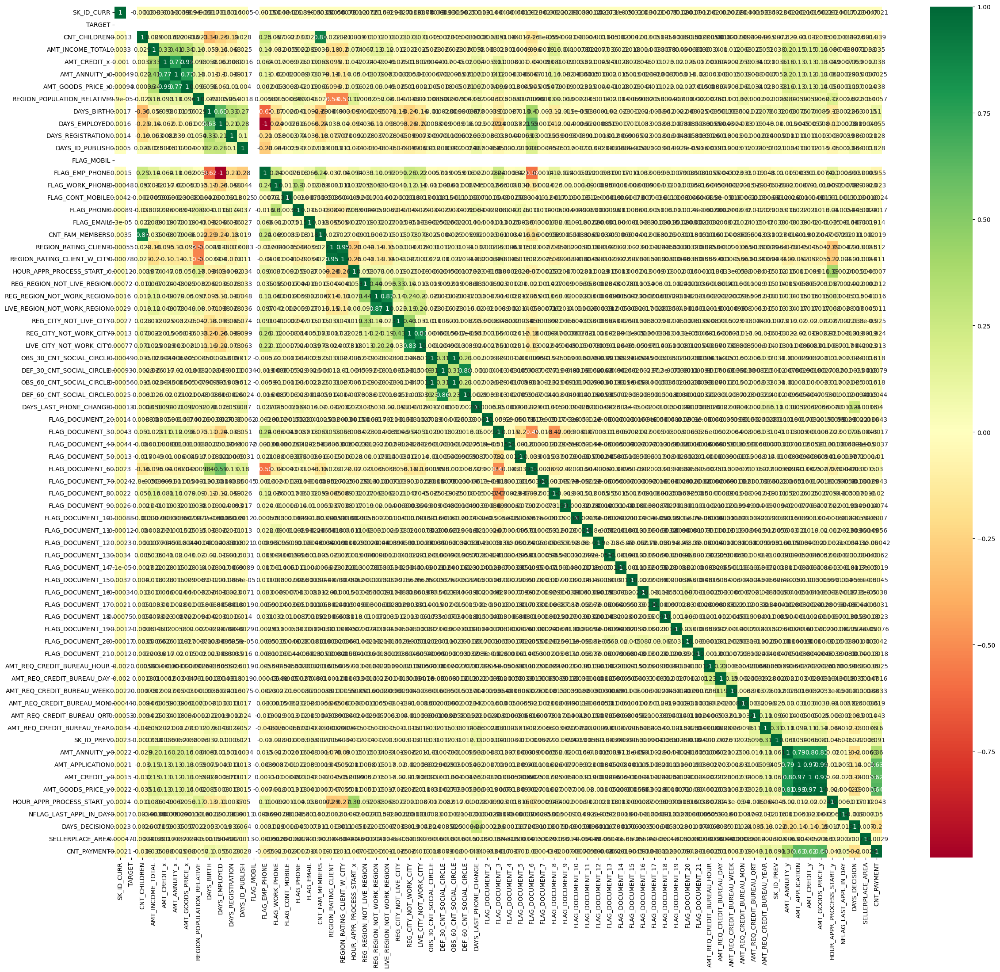

In [492]:
plt.figure(figsize=(28,25))
sns.heatmap(data= df_0.corr(), cmap='RdYlGn',annot=True)
plt.show()

In [493]:
# Replacing the diagonal values with np.nan
df_corr_0 = df_0.corr()
np.fill_diagonal(df_corr_0.values, val=np.nan)
df_corr_0

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
SK_ID_CURR,NaN,NaN,-0.001304,0.003299,-0.001034,-0.000488,-0.000937,-0.000099,0.001653,0.001582,...,0.002306,-0.002228,-0.002129,-0.001460,-0.002160,0.002392,-0.001718,0.002328,0.000472,-0.002120
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.001304,NaN,NaN,0.029159,0.003723,0.021954,0.000356,-0.023392,-0.344227,-0.248927,...,-0.007230,-0.029423,-0.029988,-0.031904,-0.035346,0.010754,0.003379,0.002566,-0.001379,-0.038657
AMT_INCOME_TOTAL,0.003299,NaN,0.029159,NaN,0.334901,0.407056,0.339205,0.156584,-0.059368,-0.141817,...,0.038413,0.201671,0.145997,0.145621,0.155862,0.085558,-0.003762,-0.007120,0.003813,0.034756
AMT_CREDIT_x,-0.001034,NaN,0.003723,0.334901,NaN,0.768633,0.986700,0.093217,0.058429,-0.062245,...,0.003643,0.155370,0.129633,0.126830,0.133577,0.049286,-0.000771,0.058842,0.001710,0.038426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUR_APPR_PROCESS_START_y,0.002392,NaN,0.010754,0.085558,0.049286,0.061916,0.055726,0.165262,-0.131379,-0.113656,...,-0.045060,-0.019896,-0.011601,-0.019991,-0.023926,NaN,0.006056,0.016686,0.011977,-0.042697
NFLAG_LAST_APPL_IN_DAY,-0.001718,NaN,0.003379,-0.003762,-0.000771,0.000294,0.000107,-0.001632,-0.002170,-0.000734,...,-0.015707,0.011251,0.005132,-0.023115,-0.004215,0.006056,NaN,-0.018888,0.000714,0.050369
DAYS_DECISION,0.002328,NaN,0.002566,-0.007120,0.058842,0.034738,0.057115,0.021646,0.052942,-0.001897,...,-0.021824,-0.200770,-0.139011,-0.137216,-0.186433,0.016686,-0.018888,NaN,0.006983,-0.201673
SELLERPLACE_AREA,0.000472,NaN,-0.001379,0.003813,0.001710,0.003692,0.002398,0.005120,-0.001480,0.000489,...,-0.008029,-0.006268,-0.003964,-0.005175,-0.006271,0.011977,0.000714,0.006983,NaN,-0.002878


In [494]:
# Getting the absolute values of matrix and then unstacking it.
df_corr_0 = df_corr_0.abs().unstack()
df_corr_0

SK_ID_CURR   SK_ID_CURR                        NaN
             TARGET                            NaN
             CNT_CHILDREN                 0.001304
             AMT_INCOME_TOTAL             0.003299
             AMT_CREDIT_x                 0.001034
                                            ...   
CNT_PAYMENT  HOUR_APPR_PROCESS_START_y    0.042697
             NFLAG_LAST_APPL_IN_DAY       0.050369
             DAYS_DECISION                0.201673
             SELLERPLACE_AREA             0.002878
             CNT_PAYMENT                       NaN
Length: 4761, dtype: float64

In [495]:
# Sorting the unstacked values and then dropping the duplicates.
df_corr_0 = df_corr_0.sort_values(ascending = False).drop_duplicates()

#### Top correlations for Target '0' dataframe - 

In [496]:
top_corr_0 = pd.DataFrame(df_corr_0,columns=['Correlation'])
top_corr_0.head(10)

,,Correlation
FLAG_EMP_PHONE,DAYS_EMPLOYED,0.999774
OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,0.998399
AMT_GOODS_PRICE_x,AMT_CREDIT_x,0.986700
AMT_GOODS_PRICE_y,AMT_APPLICATION,0.986603
AMT_APPLICATION,AMT_CREDIT_y,0.970960
AMT_GOODS_PRICE_y,AMT_CREDIT_y,0.968847
REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.949235
CNT_CHILDREN,CNT_FAM_MEMBERS,0.879662
LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,0.867661
DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,0.857442


#### Correlation matrix of Target '1' dataframe - 

In [497]:
df_1.corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
SK_ID_CURR,1.000000,NaN,-0.006383,-0.010354,-0.000697,-0.006355,-0.000896,0.006363,-0.000211,-0.007685,...,0.010743,0.005609,0.006585,0.005968,0.005935,0.001932,-0.008699,-0.004911,-0.007358,0.005550
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.006383,NaN,1.000000,0.004711,-0.000791,0.030416,-0.007511,-0.031519,-0.259278,-0.192143,...,-0.005029,-0.028697,-0.028700,-0.030205,-0.035409,-0.004512,-0.023094,0.005753,0.016359,-0.034407
AMT_INCOME_TOTAL,-0.010354,NaN,0.004711,1.000000,0.035664,0.044320,0.035038,0.008230,-0.002660,-0.014226,...,0.006257,0.018660,0.013997,0.013869,0.014512,0.013911,0.000400,-0.003319,-0.000363,0.004076
AMT_CREDIT_x,-0.000697,NaN,-0.000791,0.035664,1.000000,0.750021,0.982312,0.066703,0.142587,0.011387,...,0.018709,0.144210,0.131063,0.126854,0.131088,0.022981,0.009193,0.098614,0.026135,0.052079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUR_APPR_PROCESS_START_y,0.001932,NaN,-0.004512,0.013911,0.022981,0.045908,0.030564,0.148926,-0.099831,-0.076972,...,-0.036426,-0.042282,-0.029548,-0.035953,-0.041911,1.000000,0.007018,0.020638,0.037864,-0.040348
NFLAG_LAST_APPL_IN_DAY,-0.008699,NaN,-0.023094,0.000400,0.009193,0.004266,0.010709,0.010864,-0.000844,-0.002915,...,-0.013857,0.005072,0.000845,-0.021978,-0.006514,0.007018,1.000000,-0.014532,0.005833,0.045607
DAYS_DECISION,-0.004911,NaN,0.005753,-0.003319,0.098614,0.057835,0.099367,0.053209,0.063681,0.021660,...,-0.058079,-0.187102,-0.116391,-0.117730,-0.172620,0.020638,-0.014532,1.000000,0.050533,-0.191458
SELLERPLACE_AREA,-0.007358,NaN,0.016359,-0.000363,0.026135,0.030671,0.029477,-0.031225,-0.018787,-0.002727,...,-0.031756,-0.023033,-0.012306,-0.020016,-0.027908,0.037864,0.005833,0.050533,1.000000,-0.029062


#### Correlation heatmap of Target '1' dataframe -

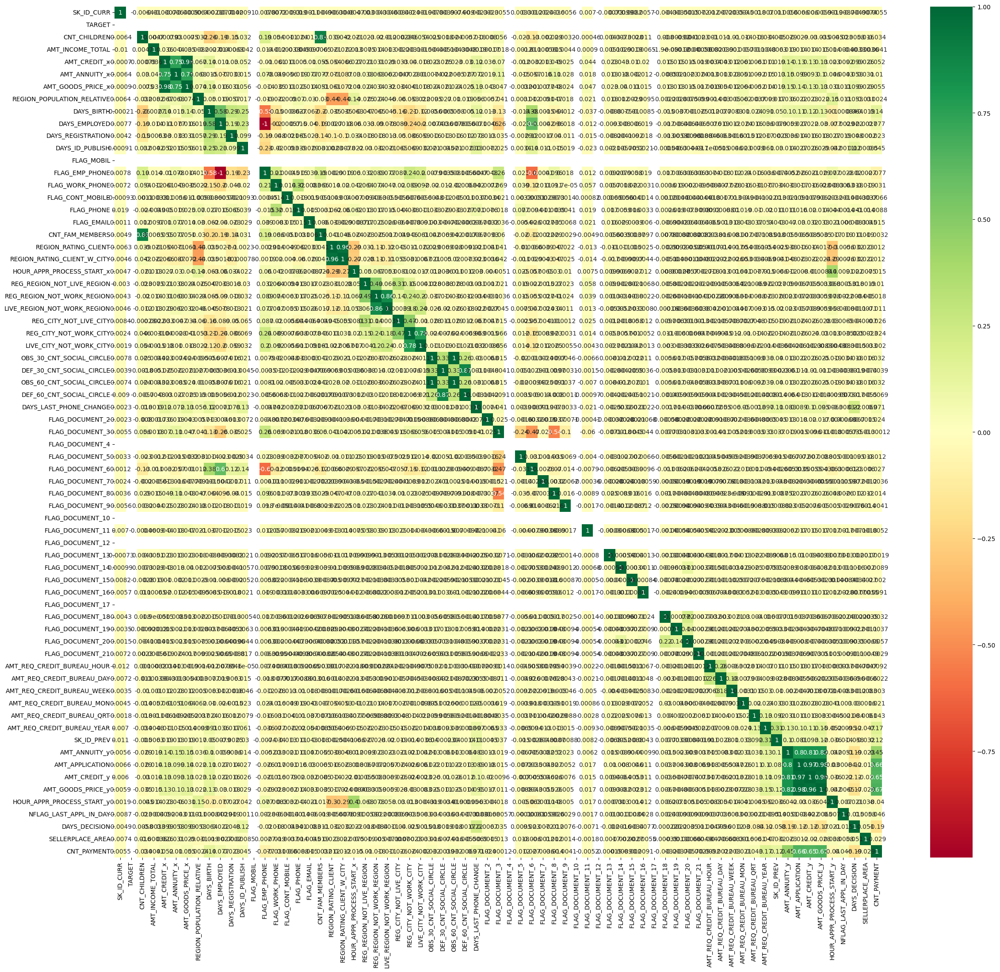

In [498]:
plt.figure(figsize=(28,25))
sns.heatmap(data= df_1.corr(), cmap='RdYlGn',annot=True)
plt.show()

In [499]:
# Replacing the diagonal values with np.nan
df_corr_1 = df_1.corr()
np.fill_diagonal(df_corr_1.values, val=np.nan)
df_corr_1

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
SK_ID_CURR,NaN,NaN,-0.006383,-0.010354,-0.000697,-0.006355,-0.000896,0.006363,-0.000211,-0.007685,...,0.010743,0.005609,0.006585,0.005968,0.005935,0.001932,-0.008699,-0.004911,-0.007358,0.005550
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.006383,NaN,NaN,0.004711,-0.000791,0.030416,-0.007511,-0.031519,-0.259278,-0.192143,...,-0.005029,-0.028697,-0.028700,-0.030205,-0.035409,-0.004512,-0.023094,0.005753,0.016359,-0.034407
AMT_INCOME_TOTAL,-0.010354,NaN,0.004711,NaN,0.035664,0.044320,0.035038,0.008230,-0.002660,-0.014226,...,0.006257,0.018660,0.013997,0.013869,0.014512,0.013911,0.000400,-0.003319,-0.000363,0.004076
AMT_CREDIT_x,-0.000697,NaN,-0.000791,0.035664,NaN,0.750021,0.982312,0.066703,0.142587,0.011387,...,0.018709,0.144210,0.131063,0.126854,0.131088,0.022981,0.009193,0.098614,0.026135,0.052079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUR_APPR_PROCESS_START_y,0.001932,NaN,-0.004512,0.013911,0.022981,0.045908,0.030564,0.148926,-0.099831,-0.076972,...,-0.036426,-0.042282,-0.029548,-0.035953,-0.041911,NaN,0.007018,0.020638,0.037864,-0.040348
NFLAG_LAST_APPL_IN_DAY,-0.008699,NaN,-0.023094,0.000400,0.009193,0.004266,0.010709,0.010864,-0.000844,-0.002915,...,-0.013857,0.005072,0.000845,-0.021978,-0.006514,0.007018,NaN,-0.014532,0.005833,0.045607
DAYS_DECISION,-0.004911,NaN,0.005753,-0.003319,0.098614,0.057835,0.099367,0.053209,0.063681,0.021660,...,-0.058079,-0.187102,-0.116391,-0.117730,-0.172620,0.020638,-0.014532,NaN,0.050533,-0.191458
SELLERPLACE_AREA,-0.007358,NaN,0.016359,-0.000363,0.026135,0.030671,0.029477,-0.031225,-0.018787,-0.002727,...,-0.031756,-0.023033,-0.012306,-0.020016,-0.027908,0.037864,0.005833,0.050533,NaN,-0.029062


In [500]:
# Getting the absolute values of matrix and then unstacking it.
df_corr_1 = df_corr_1.abs().unstack()
df_corr_1

SK_ID_CURR   SK_ID_CURR                        NaN
             TARGET                            NaN
             CNT_CHILDREN                 0.006383
             AMT_INCOME_TOTAL             0.010354
             AMT_CREDIT_x                 0.000697
                                            ...   
CNT_PAYMENT  HOUR_APPR_PROCESS_START_y    0.040348
             NFLAG_LAST_APPL_IN_DAY       0.045607
             DAYS_DECISION                0.191458
             SELLERPLACE_AREA             0.029062
             CNT_PAYMENT                       NaN
Length: 4761, dtype: float64

In [501]:
# Sorting the unstacked values and then dropping the duplicates.
df_corr_1 = df_corr_1.sort_values(ascending = False).drop_duplicates()

#### Top correlations for Target '1' dataframe - 

In [502]:
top_corr_1 = pd.DataFrame(df_corr_1,columns=['Correlation'])
top_corr_1.head(10)

Correlation
DAYS_EMPLOYED               FLAG_EMP_PHONE                  0.999695
OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE        0.998257
AMT_GOODS_PRICE_y           AMT_APPLICATION                 0.983176
AMT_CREDIT_x                AMT_GOODS_PRICE_x               0.982312
AMT_CREDIT_y                AMT_APPLICATION                 0.969466
                            AMT_GOODS_PRICE_y               0.963026
REGION_RATING_CLIENT_W_CITY REGION_RATING_CLIENT            0.957446
CNT_FAM_MEMBERS             CNT_CHILDREN                    0.886857
DEF_30_CNT_SOCIAL_CIRCLE    DEF_60_CNT_SOCIAL_CIRCLE        0.869502
REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION     0.855025